In [1]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import json

import sys
sys.path.append('../')

import utils
from utils import ax_rocs, plot_rocs, rocs_models
from evalutils.roc import get_bootstrapped_roc_ci_curves
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

## directory where results are
EXPERIMENT_DIR = f"/data/bodyct/experiments/lung-malignancy-fairness-shaurya"
NLST_PREDS = f"{EXPERIMENT_DIR}/nlst"

TEAMS_DIR = "/mnt/c/Users/shaur/OneDrive - Radboudumc/Documents - Master - Shaurya Gaur/General/Malignancy-Estimation Results/nlst"
# NLST_PREDS = TEAMS_DIR ## Comment out if not using Teams backup (aka Chansey is up :)

In [ ]:
nlst_preds = pd.read_csv(f"{NLST_PREDS}/nlst_demov1_allmodels.csv")
nlst_preds = nlst_preds[(~nlst_preds['Thijmen_mean'].isna())]
nlst_preds.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1881 entries, 0 to 15992
Data columns (total 98 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   PatientID              1881 non-null   int64  
 1   StudyDate              1881 non-null   int64  
 2   SeriesInstanceUID      1881 non-null   object 
 3   CoordX                 1881 non-null   float64
 4   CoordY                 1881 non-null   float64
 5   CoordZ                 1881 non-null   float64
 6   LesionID               1881 non-null   int64  
 7   NoduleType             1881 non-null   object 
 8   Spiculation            1881 non-null   bool   
 9   Diameter [mm]          1881 non-null   float64
 10  Age                    1881 non-null   int64  
 11  Gender                 1881 non-null   int64  
 12  FamilyHistoryLungCa    1881 non-null   bool   
 13  Emphysema              1881 non-null   bool   
 14  NoduleInUpperLung      1881 non-null   bool   
 15  NoduleCo

In [ ]:
nlst_preds.nunique()

PatientID            1061
StudyDate               3
SeriesInstanceUID    2062
CoordX               3054
CoordY               3090
                     ... 
cancphar                2
cancstom                2
cancthyr                2
canctran                1
study                   3
Length: 88, dtype: int64

In [3]:
with open(f'{NLST_PREDS}/nlst_demo_v1_cols.json') as json_data:
    nlst_democols = json.load(json_data)
    json_data.close()

In [ ]:
MODEL_TO_COL = {
    "Venkadesh": "DL",
    "de Haas Combined": "Thijmen_mean",
    "de Haas Local": "Thijmen_local",
    "de Haas Global (hidden nodule)": "Thijmen_global_hidden",
    "de Haas Global (shown nodule)": "Thijmen_global_show",
    # "Sybil": "sybil_year1",
    "PanCan2b": "PanCan2b",
}

Sanity check - let's see internal NLST validation results.

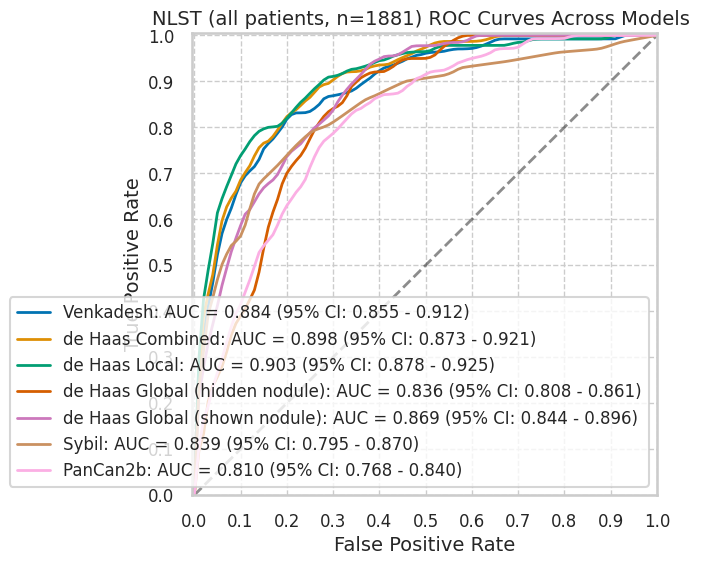

In [5]:
utils.rocs_models(nlst_preds, models=MODEL_TO_COL, dataset_label="NLST")

## Plot results by category

In [ ]:
def plot_by_category(df, cat, models=MODEL_TO_COL.keys(), min_mal=2):
    groups = df.groupby(cat) 
    df_catinfo, plot_roc = utils.info_by_splits(groups)
    display(df_catinfo)

    if (plot_roc == False) or (min(df_catinfo['num_mal']) < min_mal):
        print("Not plotting ROC since there are zero values for malignant or benign nodules :(")
        return df_catinfo

    rocs = {}
    for m in models:
        rocs[m], df_perf = utils.perf_by_splits(groups, pred_col=MODEL_TO_COL[m])
        print(m)
        display(df_perf)

    fig, ax = plt.subplots(1, len(models), figsize=(6.5*len(models) - 0.5, 6))
    fig.suptitle(f"Model Performance Split By {cat}")
    for i, m in enumerate(models):
        utils.ax_rocs(ax[i], rocs[m], title=m)
    plt.show()

    return df_catinfo        

### Included columns (from predictions)

NoduleInUpperLung


,num,pct,num_mal,pct_mal
False,1102,58.585859,65,5.898367
True,779,41.414141,73,9.370988


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1102,60,302,735,5,0.923077,0.291225,0.076923,0.708775,0.165746,0.993243,0.834254,0.006757,0.721416
True,779,64,326,380,9,0.876712,0.461756,0.123288,0.538244,0.164103,0.976864,0.835897,0.023136,0.569961


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1102,61,350,687,4,0.938462,0.337512,0.061538,0.662488,0.148418,0.994211,0.851582,0.005789,0.678766
True,779,69,401,305,4,0.945205,0.567989,0.054795,0.432011,0.146809,0.987055,0.853191,0.012945,0.480103


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1102,62,368,669,3,0.953846,0.354870,0.046154,0.645130,0.144186,0.995536,0.855814,0.004464,0.663339
True,779,70,412,294,3,0.958904,0.583569,0.041096,0.416431,0.145228,0.989899,0.854772,0.010101,0.467266


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1102,58,337,700,7,0.892308,0.324976,0.107692,0.675024,0.146835,0.990099,0.853165,0.009901,0.687840
True,779,71,411,295,2,0.972603,0.582153,0.027397,0.417847,0.147303,0.993266,0.852697,0.006734,0.469833


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1102,49,153,884,16,0.753846,0.147541,0.246154,0.852459,0.242574,0.982222,0.757426,0.017778,0.846642
True,779,55,233,473,18,0.753425,0.330028,0.246575,0.669972,0.190972,0.963340,0.809028,0.036660,0.677792


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1102,52,230,807,13,0.800000,0.221794,0.200000,0.778206,0.184397,0.984146,0.815603,0.015854,0.779492
True,779,57,218,488,16,0.780822,0.308782,0.219178,0.691218,0.207273,0.968254,0.792727,0.031746,0.699615


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1102,56,363,674,9,0.861538,0.350048,0.138462,0.649952,0.133652,0.986823,0.866348,0.013177,0.662432
True,779,66,427,279,7,0.904110,0.604816,0.095890,0.395184,0.133874,0.975524,0.866126,0.024476,0.442875


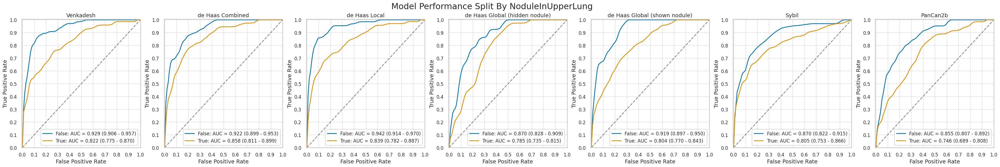

Spiculation


,num,pct,num_mal,pct_mal
False,1877,99.787347,134,7.139052
True,4,0.212653,4,100.000000


Not plotting ROC since there are zero values for malignant or benign nodules :(
NoduleType


,num,pct,num_mal,pct_mal
GroundGlassOpacity,430,22.860181,0,0.00000
NonSolid,7,0.372142,7,100.00000
PartSolid,27,1.435407,27,100.00000
Perifissural,96,5.103668,0,0.00000
SemiSolid,158,8.399787,0,0.00000
Solid,1163,61.828814,104,8.94239


Not plotting ROC since there are zero values for malignant or benign nodules :(


In [15]:
pred_only_cols = ["NoduleInUpperLung", "Spiculation", "NoduleType"]
for c in pred_only_cols:
    print(c)
    plot_by_category(nlst_preds, c)

### Demographics

marital


,num,pct,num_mal,pct_mal
1.0,74,3.934078,0,0.000000
2.0,1247,66.294524,95,7.618284
3.0,197,10.473153,14,7.106599
4.0,29,1.541733,7,24.137931
5.0,334,17.756512,22,6.586826


Not plotting ROC since there are zero values for malignant or benign nodules :(
educat


,num,pct,num_mal,pct_mal
1.0,50,2.693966,4,8.000000
2.0,127,6.842672,2,1.574803
3.0,475,25.592672,39,8.210526
4.0,260,14.008621,18,6.923077
5.0,373,20.096983,34,9.115282
6.0,300,16.163793,22,7.333333
7.0,271,14.601293,18,6.642066


Not plotting ROC since there are zero values for malignant or benign nodules :(
race


,num,pct,num_mal,pct_mal
1.0,1750,93.184239,119,6.800000
2.0,71,3.780618,10,14.084507
3.0,9,0.479233,0,0.000000
4.0,14,0.745474,8,57.142857
5.0,4,0.212993,1,25.000000
6.0,30,1.597444,0,0.000000


Not plotting ROC since there are zero values for malignant or benign nodules :(
ethnic


,num,pct,num_mal,pct_mal
1.0,13,0.691857,1,7.692308
2.0,1866,99.308143,137,7.341908


Not plotting ROC since there are zero values for malignant or benign nodules :(
Gender


,num,pct,num_mal,pct_mal
1,1107,58.851675,84,7.588076
2,774,41.148325,54,6.976744


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1,1107,80,349,674,4,0.952381,0.341153,0.047619,0.658847,0.186480,0.994100,0.813520,0.005900,0.681120
2,774,44,279,441,10,0.814815,0.387500,0.185185,0.612500,0.136223,0.977827,0.863777,0.022173,0.626615


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1,1107,81,407,616,3,0.964286,0.397849,0.035714,0.602151,0.165984,0.995153,0.834016,0.004847,0.629630
2,774,49,344,376,5,0.907407,0.477778,0.092593,0.522222,0.124682,0.986877,0.875318,0.013123,0.549096


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1,1107,80,435,588,4,0.952381,0.425220,0.047619,0.574780,0.155340,0.993243,0.844660,0.006757,0.603433
2,774,52,345,375,2,0.962963,0.479167,0.037037,0.520833,0.130982,0.994695,0.869018,0.005305,0.551680


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1,1107,78,399,624,6,0.928571,0.390029,0.071429,0.609971,0.163522,0.990476,0.836478,0.009524,0.634146
2,774,51,349,371,3,0.944444,0.484722,0.055556,0.515278,0.127500,0.991979,0.872500,0.008021,0.545220


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1,1107,66,228,795,18,0.785714,0.222874,0.214286,0.777126,0.224490,0.977860,0.775510,0.022140,0.777778
2,774,38,158,562,16,0.703704,0.219444,0.296296,0.780556,0.193878,0.972318,0.806122,0.027682,0.775194


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1,1107,63,251,772,21,0.750000,0.245357,0.250000,0.754643,0.200637,0.973518,0.799363,0.026482,0.754291
2,774,46,197,523,8,0.851852,0.273611,0.148148,0.726389,0.189300,0.984934,0.810700,0.015066,0.735142


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1,1107,76,390,633,8,0.904762,0.381232,0.095238,0.618768,0.163090,0.98752,0.836910,0.01248,0.640470
2,774,46,400,320,8,0.851852,0.555556,0.148148,0.444444,0.103139,0.97561,0.896861,0.02439,0.472868


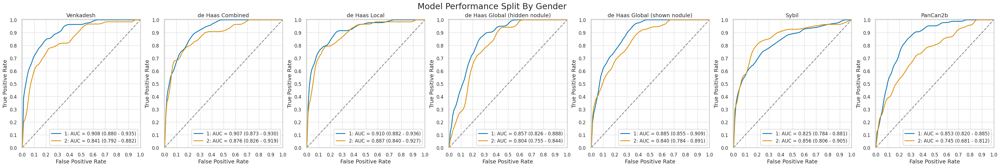

In [16]:
for cat in nlst_democols['cat']['demo']:
    print(cat)
    plot_by_category(nlst_preds, cat)

### Smoking

cigar


,num,pct,num_mal,pct_mal
0.0,1509,80.738363,116,7.687210
1.0,360,19.261637,21,5.833333


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1509,103,517,876,13,0.887931,0.371141,0.112069,0.628859,0.166129,0.985377,0.833871,0.014623,0.648774
1.0,360,20,110,229,1,0.952381,0.324484,0.047619,0.675516,0.153846,0.995652,0.846154,0.004348,0.691667


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1509,110,614,779,6,0.948276,0.440775,0.051724,0.559225,0.151934,0.992357,0.848066,0.007643,0.589132
1.0,360,19,135,204,2,0.904762,0.398230,0.095238,0.601770,0.123377,0.990291,0.876623,0.009709,0.619444


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1509,114,645,748,2,0.982759,0.463029,0.017241,0.536971,0.150198,0.997333,0.849802,0.002667,0.571239
1.0,360,17,135,204,4,0.809524,0.398230,0.190476,0.601770,0.111842,0.980769,0.888158,0.019231,0.613889


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1509,108,618,775,8,0.931034,0.443647,0.068966,0.556353,0.148760,0.989783,0.851240,0.010217,0.585156
1.0,360,20,130,209,1,0.952381,0.383481,0.047619,0.616519,0.133333,0.995238,0.866667,0.004762,0.636111


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1509,88,295,1098,28,0.758621,0.211773,0.241379,0.788227,0.229765,0.975133,0.770235,0.024867,0.785951
1.0,360,15,91,248,6,0.714286,0.268437,0.285714,0.731563,0.141509,0.976378,0.858491,0.023622,0.730556


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1509,94,370,1023,22,0.810345,0.265614,0.189655,0.734386,0.202586,0.978947,0.797414,0.021053,0.740225
1.0,360,14,76,263,7,0.666667,0.224189,0.333333,0.775811,0.155556,0.974074,0.844444,0.025926,0.769444


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1509,102,665,728,14,0.879310,0.477387,0.120690,0.522613,0.132986,0.981132,0.867014,0.018868,0.550033
1.0,360,19,123,216,2,0.904762,0.362832,0.095238,0.637168,0.133803,0.990826,0.866197,0.009174,0.652778


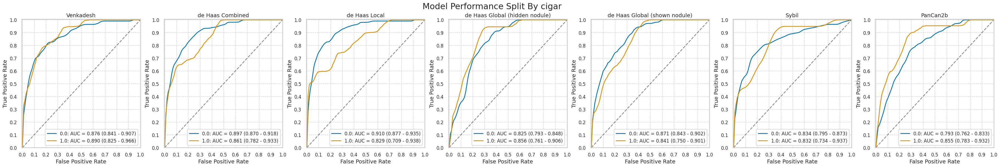

cigsmok


,num,pct,num_mal,pct_mal
0,904,48.059543,50,5.530973
1,977,51.940457,88,9.007165


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0,904,49,297,557,1,0.980000,0.347775,0.020000,0.652225,0.141618,0.998208,0.858382,0.001792,0.670354
1,977,75,331,558,13,0.852273,0.372328,0.147727,0.627672,0.184729,0.977233,0.815271,0.022767,0.647902


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0,904,47,332,522,3,0.940000,0.388759,0.060000,0.611241,0.124011,0.994286,0.875989,0.005714,0.629425
1,977,83,419,470,5,0.943182,0.471316,0.056818,0.528684,0.165339,0.989474,0.834661,0.010526,0.566018


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0,904,46,374,480,4,0.920000,0.437939,0.080000,0.562061,0.109524,0.991736,0.890476,0.008264,0.581858
1,977,86,406,483,2,0.977273,0.456693,0.022727,0.543307,0.174797,0.995876,0.825203,0.004124,0.582395


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0,904,46,373,481,4,0.920000,0.436768,0.080000,0.563232,0.109785,0.991753,0.890215,0.008247,0.582965
1,977,83,375,514,5,0.943182,0.421822,0.056818,0.578178,0.181223,0.990366,0.818777,0.009634,0.611054


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0,904,34,184,670,16,0.680000,0.215457,0.320000,0.784543,0.155963,0.976676,0.844037,0.023324,0.778761
1,977,70,202,687,18,0.795455,0.227222,0.204545,0.772778,0.257353,0.974468,0.742647,0.025532,0.774821


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0,904,39,219,635,11,0.780000,0.256440,0.220000,0.743560,0.151163,0.982972,0.848837,0.017028,0.745575
1,977,70,229,660,18,0.795455,0.257593,0.204545,0.742407,0.234114,0.973451,0.765886,0.026549,0.747185


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0,904,43,394,460,7,0.860000,0.461358,0.140000,0.538642,0.098398,0.985011,0.901602,0.014989,0.556416
1,977,79,396,493,9,0.897727,0.445444,0.102273,0.554556,0.166316,0.982072,0.833684,0.017928,0.585466


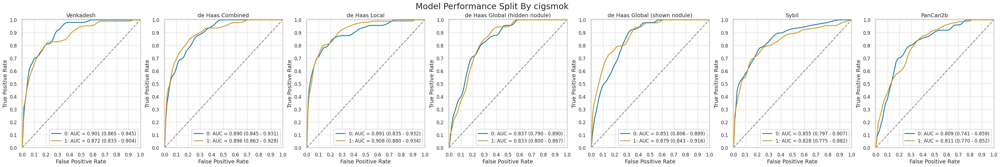

pipe


,num,pct,num_mal,pct_mal
0.0,1425,76.325656,94,6.596491
1.0,442,23.674344,43,9.728507


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1425,81,500,831,13,0.861702,0.375657,0.138298,0.624343,0.139415,0.984597,0.860585,0.015403,0.640000
1.0,442,42,125,274,1,0.976744,0.313283,0.023256,0.686717,0.251497,0.996364,0.748503,0.003636,0.714932


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1425,88,597,734,6,0.936170,0.448535,0.063830,0.551465,0.128467,0.991892,0.871533,0.008108,0.576842
1.0,442,41,150,249,2,0.953488,0.375940,0.046512,0.624060,0.214660,0.992032,0.785340,0.007968,0.656109


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1425,91,616,715,3,0.968085,0.462810,0.031915,0.537190,0.128713,0.995822,0.871287,0.004178,0.565614
1.0,442,40,162,237,3,0.930233,0.406015,0.069767,0.593985,0.198020,0.987500,0.801980,0.012500,0.626697


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1425,90,589,742,4,0.957447,0.442524,0.042553,0.557476,0.132548,0.994638,0.867452,0.005362,0.583860
1.0,442,38,159,240,5,0.883721,0.398496,0.116279,0.601504,0.192893,0.979592,0.807107,0.020408,0.628959


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1425,70,279,1052,24,0.744681,0.209617,0.255319,0.790383,0.200573,0.977695,0.799427,0.022305,0.787368
1.0,442,33,107,292,10,0.767442,0.268170,0.232558,0.731830,0.235714,0.966887,0.764286,0.033113,0.735294


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1425,74,359,972,20,0.787234,0.269722,0.212766,0.730278,0.170901,0.979839,0.829099,0.020161,0.734035
1.0,442,34,85,314,9,0.790698,0.213033,0.209302,0.786967,0.285714,0.972136,0.714286,0.027864,0.787330


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1425,81,638,693,13,0.861702,0.479339,0.138298,0.520661,0.112656,0.981586,0.887344,0.018414,0.543158
1.0,442,40,150,249,3,0.930233,0.375940,0.069767,0.624060,0.210526,0.988095,0.789474,0.011905,0.653846


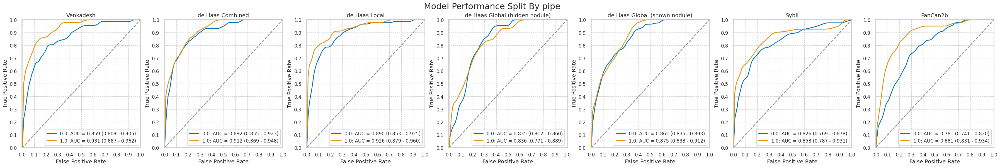

smokelive


,num,pct,num_mal,pct_mal
0.0,239,12.780749,13,5.439331
1.0,1631,87.219251,124,7.602698


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,239,12,73,153,1,0.923077,0.323009,0.076923,0.676991,0.141176,0.993506,0.858824,0.006494,0.690377
1.0,1631,111,554,953,13,0.895161,0.367618,0.104839,0.632382,0.166917,0.986542,0.833083,0.013458,0.652361


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,239,12,89,137,1,0.923077,0.393805,0.076923,0.606195,0.118812,0.992754,0.881188,0.007246,0.623431
1.0,1631,117,660,847,7,0.943548,0.437956,0.056452,0.562044,0.150579,0.991803,0.849421,0.008197,0.591048


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,239,10,116,110,3,0.769231,0.513274,0.230769,0.486726,0.079365,0.973451,0.920635,0.026549,0.502092
1.0,1631,121,664,843,3,0.975806,0.440610,0.024194,0.559390,0.154140,0.996454,0.845860,0.003546,0.591048


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,239,13,86,140,0,1.000000,0.380531,0.000000,0.619469,0.131313,1.000000,0.868687,0.000000,0.640167
1.0,1631,115,662,845,9,0.927419,0.439283,0.072581,0.560717,0.148005,0.989461,0.851995,0.010539,0.588596


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,239,8,40,186,5,0.615385,0.176991,0.384615,0.823009,0.166667,0.973822,0.833333,0.026178,0.811715
1.0,1631,95,346,1161,29,0.766129,0.229595,0.233871,0.770405,0.215420,0.975630,0.784580,0.024370,0.770080


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,239,10,51,175,3,0.769231,0.225664,0.230769,0.774336,0.163934,0.983146,0.836066,0.016854,0.774059
1.0,1631,98,395,1112,26,0.790323,0.262110,0.209677,0.737890,0.198783,0.977153,0.801217,0.022847,0.741876


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,239,12,97,129,1,0.923077,0.429204,0.076923,0.570796,0.110092,0.992308,0.889908,0.007692,0.589958
1.0,1631,109,691,816,15,0.879032,0.458527,0.120968,0.541473,0.136250,0.981949,0.863750,0.018051,0.567137


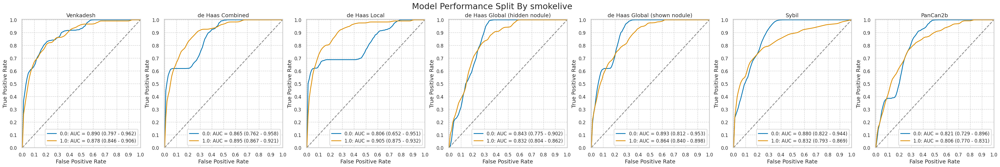

smokework


,num,pct,num_mal,pct_mal
0.0,240,12.924071,17,7.083333
1.0,1617,87.075929,121,7.482993


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,240,15,93,130,2,0.882353,0.417040,0.117647,0.582960,0.138889,0.984848,0.861111,0.015152,0.604167
1.0,1617,109,530,966,12,0.900826,0.354278,0.099174,0.645722,0.170579,0.987730,0.829421,0.012270,0.664811


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,240,16,90,133,1,0.941176,0.403587,0.058824,0.596413,0.150943,0.992537,0.849057,0.007463,0.620833
1.0,1617,114,656,840,7,0.942149,0.438503,0.057851,0.561497,0.148052,0.991736,0.851948,0.008264,0.589981


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,240,16,102,121,1,0.941176,0.457399,0.058824,0.542601,0.135593,0.991803,0.864407,0.008197,0.570833
1.0,1617,116,672,824,5,0.958678,0.449198,0.041322,0.550802,0.147208,0.993969,0.852792,0.006031,0.581323


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,240,17,117,106,0,1.00000,0.524664,0.00000,0.475336,0.126866,1.000000,0.873134,0.000000,0.512500
1.0,1617,112,628,868,9,0.92562,0.419786,0.07438,0.580214,0.151351,0.989738,0.848649,0.010262,0.606061


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,240,14,50,173,3,0.823529,0.224215,0.176471,0.775785,0.218750,0.982955,0.781250,0.017045,0.779167
1.0,1617,90,333,1163,31,0.743802,0.222594,0.256198,0.777406,0.212766,0.974037,0.787234,0.025963,0.774892


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,240,13,66,157,4,0.764706,0.295964,0.235294,0.704036,0.164557,0.975155,0.835443,0.024845,0.708333
1.0,1617,96,380,1116,25,0.793388,0.254011,0.206612,0.745989,0.201681,0.978089,0.798319,0.021911,0.749536


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,240,13,112,111,4,0.764706,0.502242,0.235294,0.497758,0.104000,0.965217,0.896000,0.034783,0.516667
1.0,1617,109,667,829,12,0.900826,0.445856,0.099174,0.554144,0.140464,0.985731,0.859536,0.014269,0.580087


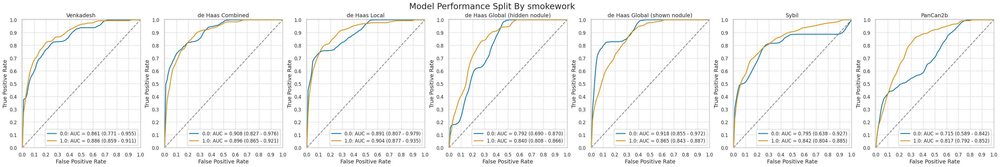

In [17]:
for cat in nlst_democols['cat']['smoke']:
    print(cat)
    plot_by_category(nlst_preds, cat)

### Work history

wrkasbe


,num,pct,num_mal,pct_mal
0.0,1703,90.536948,129,7.574868
1.0,178,9.463052,9,5.056180


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1703,115,558,1016,14,0.891473,0.354511,0.108527,0.645489,0.170877,0.986408,0.829123,0.013592,0.664122
1.0,178,9,70,99,0,1.000000,0.414201,0.000000,0.585799,0.113924,1.000000,0.886076,0.000000,0.606742


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1703,122,680,894,7,0.945736,0.432020,0.054264,0.567980,0.152120,0.992231,0.847880,0.007769,0.596594
1.0,178,8,71,98,1,0.888889,0.420118,0.111111,0.579882,0.101266,0.989899,0.898734,0.010101,0.595506


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1703,124,701,873,5,0.961240,0.445362,0.038760,0.554638,0.150303,0.994305,0.849697,0.005695,0.585437
1.0,178,8,79,90,1,0.888889,0.467456,0.111111,0.532544,0.091954,0.989011,0.908046,0.010989,0.550562


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1703,120,703,871,9,0.930233,0.446633,0.069767,0.553367,0.145808,0.989773,0.854192,0.010227,0.581914
1.0,178,9,45,124,0,1.000000,0.266272,0.000000,0.733728,0.166667,1.000000,0.833333,0.000000,0.747191


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1703,95,353,1221,34,0.736434,0.224269,0.263566,0.775731,0.212054,0.972908,0.787946,0.027092,0.772754
1.0,178,9,33,136,0,1.000000,0.195266,0.000000,0.804734,0.214286,1.000000,0.785714,0.000000,0.814607


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1703,103,365,1209,26,0.798450,0.231893,0.201550,0.768107,0.220085,0.978947,0.779915,0.021053,0.770405
1.0,178,6,83,86,3,0.666667,0.491124,0.333333,0.508876,0.067416,0.966292,0.932584,0.033708,0.516854


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1703,114,709,865,15,0.883721,0.450445,0.116279,0.549555,0.138518,0.982955,0.861482,0.017045,0.574868
1.0,178,8,81,88,1,0.888889,0.479290,0.111111,0.520710,0.089888,0.988764,0.910112,0.011236,0.539326


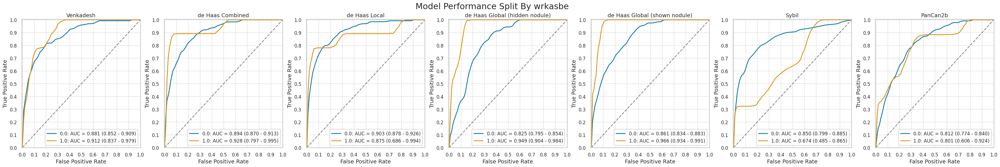

wrkbaki


,num,pct,num_mal,pct_mal
0.0,1847,98.192451,135,7.309150
1.0,34,1.807549,3,8.823529


Not plotting ROC since there are zero values for malignant or benign nodules :(
wrkbutc


,num,pct,num_mal,pct_mal
0.0,1859,98.830409,135,7.261969
1.0,22,1.169591,3,13.636364


Not plotting ROC since there are zero values for malignant or benign nodules :(
wrkchem


,num,pct,num_mal,pct_mal
0.0,1736,92.389569,131,7.546083
1.0,143,7.610431,7,4.895105


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1736,117,583,1022,14,0.89313,0.363240,0.10687,0.636760,0.167143,0.986486,0.832857,0.013514,0.656106
1.0,143,7,45,91,0,1.00000,0.330882,0.00000,0.669118,0.134615,1.000000,0.865385,0.000000,0.685315


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1736,123,707,898,8,0.938931,0.440498,0.061069,0.559502,0.148193,0.99117,0.851807,0.00883,0.588134
1.0,143,7,43,93,0,1.000000,0.316176,0.000000,0.683824,0.140000,1.00000,0.860000,0.00000,0.699301


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1736,125,728,877,6,0.954198,0.453583,0.045802,0.546417,0.146542,0.993205,0.853458,0.006795,0.577189
1.0,143,7,52,84,0,1.000000,0.382353,0.000000,0.617647,0.118644,1.000000,0.881356,0.000000,0.636364


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1736,122,710,895,9,0.931298,0.442368,0.068702,0.557632,0.146635,0.990044,0.853365,0.009956,0.585829
1.0,143,7,36,100,0,1.000000,0.264706,0.000000,0.735294,0.162791,1.000000,0.837209,0.000000,0.748252


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1736,98,361,1244,33,0.748092,0.224922,0.251908,0.775078,0.213508,0.974158,0.786492,0.025842,0.773041
1.0,143,6,23,113,1,0.857143,0.169118,0.142857,0.830882,0.206897,0.991228,0.793103,0.008772,0.832168


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1736,105,403,1202,26,0.801527,0.251090,0.198473,0.748910,0.206693,0.978827,0.793307,0.021173,0.752880
1.0,143,4,45,91,3,0.571429,0.330882,0.428571,0.669118,0.081633,0.968085,0.918367,0.031915,0.664336


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1736,116,737,868,15,0.885496,0.459190,0.114504,0.540810,0.135991,0.983012,0.864009,0.016988,0.566820
1.0,143,6,53,83,1,0.857143,0.389706,0.142857,0.610294,0.101695,0.988095,0.898305,0.011905,0.622378


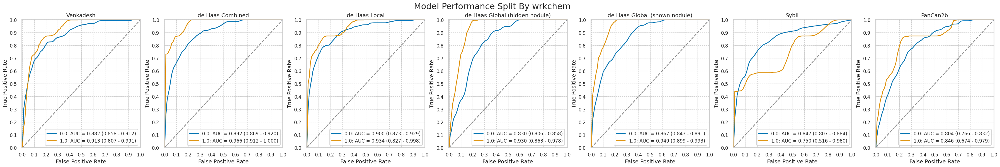

wrkcoal


,num,pct,num_mal,pct_mal
0.0,1878,99.84051,137,7.294995
1.0,3,0.15949,1,33.333333


Not plotting ROC since there are zero values for malignant or benign nodules :(
wrkcott


,num,pct,num_mal,pct_mal
0.0,1871,99.468368,136,7.26884
1.0,10,0.531632,2,20.00000


Not plotting ROC since there are zero values for malignant or benign nodules :(
wrkfarm


,num,pct,num_mal,pct_mal
0.0,1633,86.815524,130,7.960808
1.0,248,13.184476,8,3.225806


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1633,116,543,960,14,0.892308,0.361277,0.107692,0.638723,0.176024,0.985626,0.823976,0.014374,0.658910
1.0,248,8,85,155,0,1.000000,0.354167,0.000000,0.645833,0.086022,1.000000,0.913978,0.000000,0.657258


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1633,122,677,826,8,0.938462,0.450432,0.061538,0.549568,0.152691,0.990408,0.847309,0.009592,0.580527
1.0,248,8,74,166,0,1.000000,0.308333,0.000000,0.691667,0.097561,1.000000,0.902439,0.000000,0.701613


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1633,124,671,832,6,0.953846,0.446440,0.046154,0.553560,0.155975,0.99284,0.844025,0.00716,0.585426
1.0,248,8,109,131,0,1.000000,0.454167,0.000000,0.545833,0.068376,1.00000,0.931624,0.00000,0.560484


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1633,121,655,848,9,0.930769,0.435795,0.069231,0.564205,0.155928,0.989498,0.844072,0.010502,0.593386
1.0,248,8,93,147,0,1.000000,0.387500,0.000000,0.612500,0.079208,1.000000,0.920792,0.000000,0.625000


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1633,97,325,1178,33,0.746154,0.216234,0.253846,0.783766,0.229858,0.972750,0.770142,0.027250,0.780772
1.0,248,7,61,179,1,0.875000,0.254167,0.125000,0.745833,0.102941,0.994444,0.897059,0.005556,0.750000


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1633,104,387,1116,26,0.800,0.257485,0.200,0.742515,0.211813,0.977233,0.788187,0.022767,0.747091
1.0,248,5,61,179,3,0.625,0.254167,0.375,0.745833,0.075758,0.983516,0.924242,0.016484,0.741935


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1633,115,690,813,15,0.884615,0.459082,0.115385,0.540918,0.142857,0.981884,0.857143,0.018116,0.568279
1.0,248,7,100,140,1,0.875000,0.416667,0.125000,0.583333,0.065421,0.992908,0.934579,0.007092,0.592742


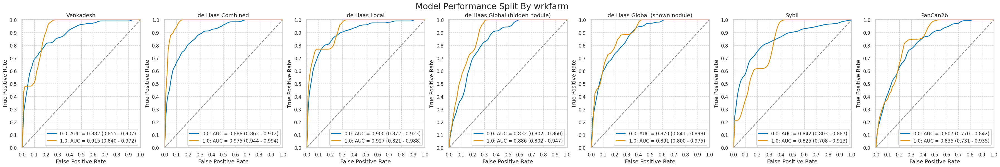

wrkfire


,num,pct,num_mal,pct_mal
0.0,1853,98.51143,135,7.285483
1.0,28,1.48857,3,10.714286


Not plotting ROC since there are zero values for malignant or benign nodules :(
wrkflou


,num,pct,num_mal,pct_mal
0.0,1855,98.617757,138,7.439353
1.0,26,1.382243,0,0.000000


Not plotting ROC since there are zero values for malignant or benign nodules :(
wrkfoun


,num,pct,num_mal,pct_mal
0.0,1810,96.225412,127,7.016575
1.0,71,3.774588,11,15.492958


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1810,115,596,1087,12,0.905512,0.354130,0.094488,0.645870,0.161744,0.989081,0.838256,0.010919,0.664088
1.0,71,9,32,28,2,0.818182,0.533333,0.181818,0.466667,0.219512,0.933333,0.780488,0.066667,0.521127


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1810,119,722,961,8,0.937008,0.428996,0.062992,0.571004,0.141498,0.991744,0.858502,0.008256,0.596685
1.0,71,11,29,31,0,1.000000,0.483333,0.000000,0.516667,0.275000,1.000000,0.725000,0.000000,0.591549


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1810,121,744,939,6,0.952756,0.442068,0.047244,0.557932,0.139884,0.993651,0.860116,0.006349,0.585635
1.0,71,11,36,24,0,1.000000,0.600000,0.000000,0.400000,0.234043,1.000000,0.765957,0.000000,0.492958


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1810,118,723,960,9,0.929134,0.429590,0.070866,0.570410,0.140309,0.990712,0.859691,0.009288,0.595580
1.0,71,11,25,35,0,1.000000,0.416667,0.000000,0.583333,0.305556,1.000000,0.694444,0.000000,0.647887


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1810,95,367,1316,32,0.748031,0.218063,0.251969,0.781937,0.205628,0.976261,0.794372,0.023739,0.779558
1.0,71,9,19,41,2,0.818182,0.316667,0.181818,0.683333,0.321429,0.953488,0.678571,0.046512,0.704225


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1810,102,422,1261,25,0.803150,0.250743,0.196850,0.749257,0.194656,0.980560,0.805344,0.019440,0.753039
1.0,71,7,26,34,4,0.636364,0.433333,0.363636,0.566667,0.212121,0.894737,0.787879,0.105263,0.577465


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1810,113,757,926,14,0.889764,0.449792,0.110236,0.550208,0.129885,0.985106,0.870115,0.014894,0.574033
1.0,71,9,33,27,2,0.818182,0.550000,0.181818,0.450000,0.214286,0.931034,0.785714,0.068966,0.507042


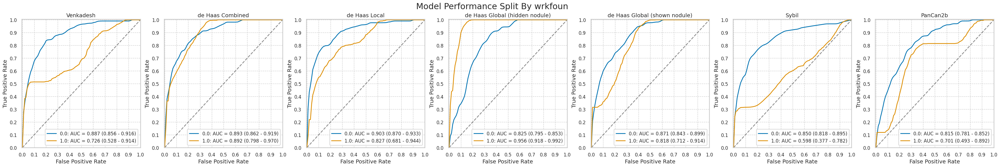

wrkhard


,num,pct,num_mal,pct_mal
0.0,1864,99.096225,138,7.403433
1.0,17,0.903775,0,0.000000


Not plotting ROC since there are zero values for malignant or benign nodules :(
wrkpain


,num,pct,num_mal,pct_mal
0.0,1758,93.460925,128,7.281001
1.0,123,6.539075,10,8.130081


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1758,114,586,1044,14,0.890625,0.359509,0.109375,0.640491,0.162857,0.986767,0.837143,0.013233,0.658703
1.0,123,10,42,71,0,1.000000,0.371681,0.000000,0.628319,0.192308,1.000000,0.807692,0.000000,0.658537


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1758,121,706,924,7,0.945312,0.433129,0.054688,0.566871,0.146312,0.992481,0.853688,0.007519,0.594425
1.0,123,9,45,68,1,0.900000,0.398230,0.100000,0.601770,0.166667,0.985507,0.833333,0.014493,0.626016


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1758,122,723,907,6,0.953125,0.443558,0.046875,0.556442,0.144379,0.993428,0.855621,0.006572,0.585324
1.0,123,10,57,56,0,1.000000,0.504425,0.000000,0.495575,0.149254,1.000000,0.850746,0.000000,0.536585


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1758,123,712,918,5,0.960938,0.436810,0.039062,0.563190,0.147305,0.994583,0.852695,0.005417,0.592150
1.0,123,6,36,77,4,0.600000,0.318584,0.400000,0.681416,0.142857,0.950617,0.857143,0.049383,0.674797


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1758,96,358,1272,32,0.75,0.219632,0.25,0.780368,0.211454,0.975460,0.788546,0.024540,0.778157
1.0,123,8,28,85,2,0.80,0.247788,0.20,0.752212,0.222222,0.977011,0.777778,0.022989,0.756098


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1758,100,419,1211,28,0.78125,0.257055,0.21875,0.742945,0.192678,0.977401,0.807322,0.022599,0.745734
1.0,123,9,29,84,1,0.90000,0.256637,0.10000,0.743363,0.236842,0.988235,0.763158,0.011765,0.756098


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1758,112,744,886,16,0.875,0.456442,0.125,0.543558,0.130841,0.982262,0.869159,0.017738,0.567691
1.0,123,10,46,67,0,1.000,0.407080,0.000,0.592920,0.178571,1.000000,0.821429,0.000000,0.626016


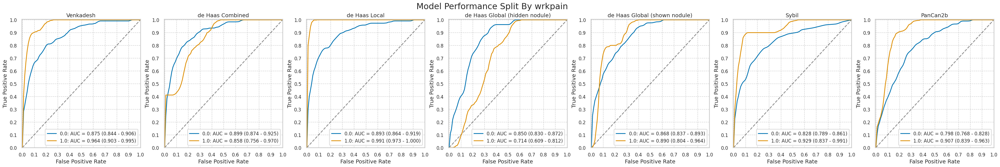

wrksand


,num,pct,num_mal,pct_mal
0.0,1825,97.02286,128,7.013699
1.0,56,2.97714,10,17.857143


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1825,114,602,1095,14,0.890625,0.354744,0.109375,0.645256,0.159218,0.987376,0.840782,0.012624,0.662466
1.0,56,10,26,20,0,1.000000,0.565217,0.000000,0.434783,0.277778,1.000000,0.722222,0.000000,0.535714


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1825,122,723,974,6,0.953125,0.426046,0.046875,0.573954,0.144379,0.993878,0.855621,0.006122,0.600548
1.0,56,8,28,18,2,0.800000,0.608696,0.200000,0.391304,0.222222,0.900000,0.777778,0.100000,0.464286


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1825,123,755,942,5,0.960938,0.444903,0.039062,0.555097,0.140091,0.994720,0.859909,0.005280,0.583562
1.0,56,9,25,21,1,0.900000,0.543478,0.100000,0.456522,0.264706,0.954545,0.735294,0.045455,0.535714


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1825,123,734,963,5,0.960938,0.432528,0.039062,0.567472,0.143524,0.994835,0.856476,0.005165,0.595068
1.0,56,6,14,32,4,0.600000,0.304348,0.400000,0.695652,0.300000,0.888889,0.700000,0.111111,0.678571


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1825,96,376,1321,32,0.75,0.221567,0.25,0.778433,0.203390,0.976349,0.796610,0.023651,0.776438
1.0,56,8,10,36,2,0.80,0.217391,0.20,0.782609,0.444444,0.947368,0.555556,0.052632,0.785714


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1825,101,440,1257,27,0.789062,0.259281,0.210938,0.740719,0.186691,0.978972,0.813309,0.021028,0.744110
1.0,56,8,8,38,2,0.800000,0.173913,0.200000,0.826087,0.500000,0.950000,0.500000,0.050000,0.821429


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1825,112,767,930,16,0.875,0.451974,0.125,0.548026,0.127418,0.983087,0.872582,0.016913,0.570959
1.0,56,10,23,23,0,1.000,0.500000,0.000,0.500000,0.303030,1.000000,0.696970,0.000000,0.589286


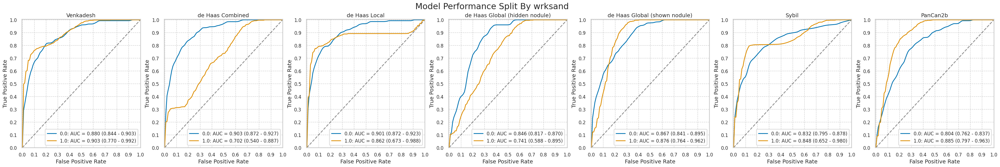

wrkweld


,num,pct,num_mal,pct_mal
0.0,1746,92.822967,124,7.101947
1.0,135,7.177033,14,10.370370


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1746,110,573,1049,14,0.887097,0.353268,0.112903,0.646732,0.161054,0.98683,0.838946,0.01317,0.663803
1.0,135,14,55,66,0,1.000000,0.454545,0.000000,0.545455,0.202899,1.00000,0.797101,0.00000,0.592593


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1746,117,704,918,7,0.943548,0.434032,0.056452,0.565968,0.142509,0.992432,0.857491,0.007568,0.592784
1.0,135,13,47,74,1,0.928571,0.388430,0.071429,0.611570,0.216667,0.986667,0.783333,0.013333,0.644444


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1746,118,724,898,6,0.951613,0.446363,0.048387,0.553637,0.140143,0.993363,0.859857,0.006637,0.581901
1.0,135,14,56,65,0,1.000000,0.462810,0.000000,0.537190,0.200000,1.000000,0.800000,0.000000,0.585185


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1746,119,706,916,5,0.959677,0.435265,0.040323,0.564735,0.144242,0.994571,0.855758,0.005429,0.592784
1.0,135,10,42,79,4,0.714286,0.347107,0.285714,0.652893,0.192308,0.951807,0.807692,0.048193,0.659259


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1746,93,351,1271,31,0.750000,0.216400,0.250000,0.783600,0.209459,0.976190,0.790541,0.023810,0.781214
1.0,135,11,35,86,3,0.785714,0.289256,0.214286,0.710744,0.239130,0.966292,0.760870,0.033708,0.718519


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1746,98,408,1214,26,0.790323,0.251541,0.209677,0.748459,0.193676,0.979032,0.806324,0.020968,0.751432
1.0,135,11,40,81,3,0.785714,0.330579,0.214286,0.669421,0.215686,0.964286,0.784314,0.035714,0.681481


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1746,109,729,893,15,0.879032,0.449445,0.120968,0.550555,0.130072,0.983480,0.869928,0.016520,0.573883
1.0,135,13,61,60,1,0.928571,0.504132,0.071429,0.495868,0.175676,0.983607,0.824324,0.016393,0.540741


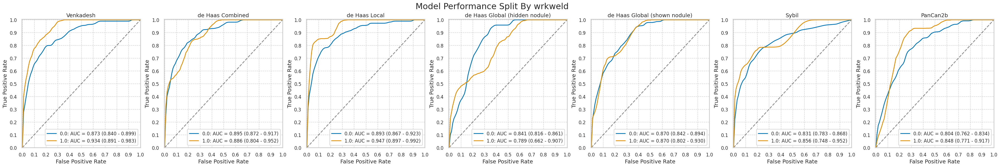

wrknomask


,num,pct,num_mal,pct_mal
False,1387,73.737374,110,7.930786
True,494,26.262626,28,5.668016


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1387,98,463,814,12,0.890909,0.362569,0.109091,0.637431,0.174688,0.985472,0.825312,0.014528,0.657534
True,494,26,165,301,2,0.928571,0.354077,0.071429,0.645923,0.136126,0.993399,0.863874,0.006601,0.661943


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1387,104,579,698,6,0.945455,0.453406,0.054545,0.546594,0.152269,0.991477,0.847731,0.008523,0.578226
True,494,26,172,294,2,0.928571,0.369099,0.071429,0.630901,0.131313,0.993243,0.868687,0.006757,0.647773


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1387,105,577,700,5,0.954545,0.451840,0.045455,0.548160,0.153959,0.992908,0.846041,0.007092,0.580389
True,494,27,203,263,1,0.964286,0.435622,0.035714,0.564378,0.117391,0.996212,0.882609,0.003788,0.587045


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1387,105,578,699,5,0.954545,0.452623,0.045455,0.547377,0.153734,0.992898,0.846266,0.007102,0.579668
True,494,24,170,296,4,0.857143,0.364807,0.142857,0.635193,0.123711,0.986667,0.876289,0.013333,0.647773


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1387,82,273,1004,28,0.745455,0.213782,0.254545,0.786218,0.230986,0.972868,0.769014,0.027132,0.782985
True,494,22,113,353,6,0.785714,0.242489,0.214286,0.757511,0.162963,0.983287,0.837037,0.016713,0.759109


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1387,89,312,965,21,0.809091,0.244323,0.190909,0.755677,0.221945,0.978702,0.778055,0.021298,0.759913
True,494,20,136,330,8,0.714286,0.291845,0.285714,0.708155,0.128205,0.976331,0.871795,0.023669,0.708502


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1387,97,591,686,13,0.881818,0.462803,0.118182,0.537197,0.140988,0.981402,0.859012,0.018598,0.564528
True,494,25,199,267,3,0.892857,0.427039,0.107143,0.572961,0.111607,0.988889,0.888393,0.011111,0.591093


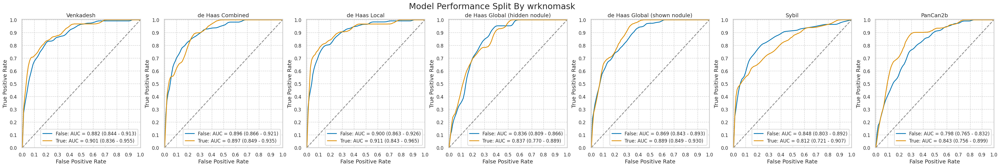

In [18]:
for cat in nlst_democols['cat']['work']:
    print(cat)
    plot_by_category(nlst_preds, cat)

### Disease history

,num,pct,num_mal,pct_mal
False,1240,65.922382,79,6.370968
True,641,34.077618,59,9.204368


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1240,73,399,762,6,0.924051,0.343669,0.075949,0.656331,0.154661,0.992188,0.845339,0.007812,0.673387
True,641,51,229,353,8,0.864407,0.393471,0.135593,0.606529,0.182143,0.977839,0.817857,0.022161,0.630265


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1240,75,471,690,4,0.949367,0.405685,0.050633,0.594315,0.137363,0.994236,0.862637,0.005764,0.616935
True,641,55,280,302,4,0.932203,0.481100,0.067797,0.518900,0.164179,0.986928,0.835821,0.013072,0.556942


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1240,78,499,662,1,0.987342,0.429802,0.012658,0.570198,0.135182,0.998492,0.864818,0.001508,0.596774
True,641,54,281,301,5,0.915254,0.482818,0.084746,0.517182,0.161194,0.983660,0.838806,0.016340,0.553822


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1240,73,466,695,6,0.924051,0.401378,0.075949,0.598622,0.135436,0.991441,0.864564,0.008559,0.619355
True,641,56,282,300,3,0.949153,0.484536,0.050847,0.515464,0.165680,0.990099,0.834320,0.009901,0.555382


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1240,61,227,934,18,0.772152,0.195521,0.227848,0.804479,0.211806,0.981092,0.788194,0.018908,0.802419
True,641,43,159,423,16,0.728814,0.273196,0.271186,0.726804,0.212871,0.963554,0.787129,0.036446,0.726989


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1240,67,275,886,12,0.848101,0.236865,0.151899,0.763135,0.195906,0.986637,0.804094,0.013363,0.768548
True,641,42,173,409,17,0.711864,0.297251,0.288136,0.702749,0.195349,0.960094,0.804651,0.039906,0.703588


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1240,71,460,701,8,0.898734,0.39621,0.101266,0.60379,0.133710,0.988717,0.866290,0.011283,0.622581
True,641,51,330,252,8,0.864407,0.56701,0.135593,0.43299,0.133858,0.969231,0.866142,0.030769,0.472699


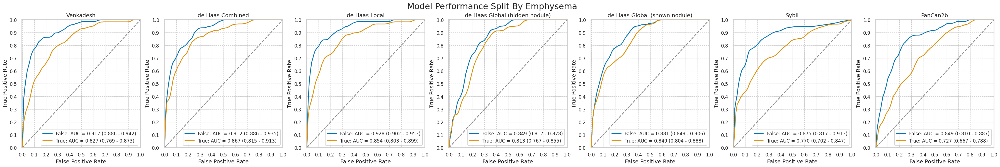

,num,pct,num_mal,pct_mal
False,1240,65.922382,79,6.370968
True,641,34.077618,59,9.204368


In [19]:
plot_by_category(nlst_preds, 'Emphysema')

diagadas


,num,pct,num_mal,pct_mal
0.0,1763,93.726741,127,7.203630
1.0,118,6.273259,11,9.322034


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1763,116,575,1061,11,0.913386,0.351467,0.086614,0.648533,0.167873,0.989739,0.832127,0.010261,0.667612
1.0,118,8,53,54,3,0.727273,0.495327,0.272727,0.504673,0.131148,0.947368,0.868852,0.052632,0.525424


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1763,120,691,945,7,0.944882,0.422372,0.055118,0.577628,0.147965,0.992647,0.852035,0.007353,0.604084
1.0,118,10,60,47,1,0.909091,0.560748,0.090909,0.439252,0.142857,0.979167,0.857143,0.020833,0.483051


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1763,122,722,914,5,0.960630,0.441320,0.039370,0.558680,0.144550,0.994559,0.855450,0.005441,0.587635
1.0,118,10,58,49,1,0.909091,0.542056,0.090909,0.457944,0.147059,0.980000,0.852941,0.020000,0.500000


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1763,118,686,950,9,0.929134,0.419315,0.070866,0.580685,0.146766,0.990615,0.853234,0.009385,0.605786
1.0,118,11,62,45,0,1.000000,0.579439,0.000000,0.420561,0.150685,1.000000,0.849315,0.000000,0.474576


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1763,95,350,1286,32,0.748031,0.213936,0.251969,0.786064,0.213483,0.975721,0.786517,0.024279,0.783324
1.0,118,9,36,71,2,0.818182,0.336449,0.181818,0.663551,0.200000,0.972603,0.800000,0.027397,0.677966


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1763,103,390,1246,24,0.811024,0.238386,0.188976,0.761614,0.208925,0.981102,0.791075,0.018898,0.765173
1.0,118,6,58,49,5,0.545455,0.542056,0.454545,0.457944,0.093750,0.907407,0.906250,0.092593,0.466102


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1763,114,719,917,13,0.897638,0.439487,0.102362,0.560513,0.136855,0.986022,0.863145,0.013978,0.584799
1.0,118,8,71,36,3,0.727273,0.663551,0.272727,0.336449,0.101266,0.923077,0.898734,0.076923,0.372881


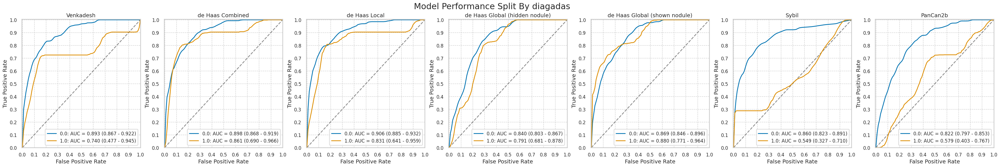

diagasbe


,num,pct,num_mal,pct_mal
0.0,1835,97.658329,138,7.520436
1.0,44,2.341671,0,0.000000


Not plotting ROC since there are zero values for malignant or benign nodules :(
diagbron


,num,pct,num_mal,pct_mal
0.0,1795,95.529537,135,7.520891
1.0,84,4.470463,3,3.571429


Not plotting ROC since there are zero values for malignant or benign nodules :(
diagchas


,num,pct,num_mal,pct_mal
0.0,1825,97.02286,136,7.452055
1.0,56,2.97714,2,3.571429


Not plotting ROC since there are zero values for malignant or benign nodules :(
diagchro


,num,pct,num_mal,pct_mal
0.0,1661,88.492275,120,7.224564
1.0,216,11.507725,18,8.333333


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1661,108,554,987,12,0.900000,0.359507,0.100000,0.640493,0.163142,0.987988,0.836858,0.012012,0.659241
1.0,216,16,70,128,2,0.888889,0.353535,0.111111,0.646465,0.186047,0.984615,0.813953,0.015385,0.666667


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1661,113,678,863,7,0.941667,0.439974,0.058333,0.560026,0.142857,0.991954,0.857143,0.008046,0.587598
1.0,216,17,70,128,1,0.944444,0.353535,0.055556,0.646465,0.195402,0.992248,0.804598,0.007752,0.671296


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1661,115,680,861,5,0.958333,0.441272,0.041667,0.558728,0.144654,0.994226,0.855346,0.005774,0.587598
1.0,216,17,96,102,1,0.944444,0.484848,0.055556,0.515152,0.150442,0.990291,0.849558,0.009709,0.550926


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1661,111,666,875,9,0.925,0.432187,0.075,0.567813,0.142857,0.989819,0.857143,0.010181,0.593618
1.0,216,18,79,119,0,1.000,0.398990,0.000,0.601010,0.185567,1.000000,0.814433,0.000000,0.634259


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1661,86,344,1197,34,0.716667,0.223232,0.283333,0.776768,0.200000,0.97238,0.800000,0.02762,0.772426
1.0,216,18,39,159,0,1.000000,0.196970,0.000000,0.803030,0.315789,1.00000,0.684211,0.00000,0.819444


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1661,96,388,1153,24,0.800000,0.251785,0.200000,0.748215,0.198347,0.979609,0.801653,0.020391,0.751957
1.0,216,13,59,139,5,0.722222,0.297980,0.277778,0.702020,0.180556,0.965278,0.819444,0.034722,0.703704


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1661,106,698,843,14,0.883333,0.452953,0.116667,0.547047,0.131841,0.983664,0.868159,0.016336,0.571343
1.0,216,16,91,107,2,0.888889,0.459596,0.111111,0.540404,0.149533,0.981651,0.850467,0.018349,0.569444


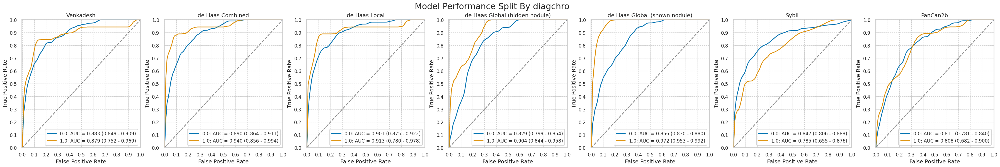

diagcopd


,num,pct,num_mal,pct_mal
0.0,1745,93.017058,131,7.507163
1.0,131,6.982942,7,5.343511


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1745,117,573,1041,14,0.89313,0.355019,0.10687,0.644981,0.169565,0.98673,0.830435,0.01327,0.663610
1.0,131,7,51,73,0,1.00000,0.411290,0.00000,0.588710,0.120690,1.00000,0.879310,0.00000,0.610687


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1745,123,698,916,8,0.938931,0.432466,0.061069,0.567534,0.149817,0.991342,0.850183,0.008658,0.595415
1.0,131,7,53,71,0,1.000000,0.427419,0.000000,0.572581,0.116667,1.000000,0.883333,0.000000,0.595420


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1745,125,701,913,6,0.954198,0.434325,0.045802,0.565675,0.151332,0.993471,0.848668,0.006529,0.594842
1.0,131,7,75,49,0,1.000000,0.604839,0.000000,0.395161,0.085366,1.000000,0.914634,0.000000,0.427481


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1745,123,692,922,8,0.938931,0.428748,0.061069,0.571252,0.150920,0.991398,0.849080,0.008602,0.598854
1.0,131,6,55,69,1,0.857143,0.443548,0.142857,0.556452,0.098361,0.985714,0.901639,0.014286,0.572519


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1745,98,362,1252,33,0.748092,0.224287,0.251908,0.775713,0.213043,0.974319,0.786957,0.025681,0.773639
1.0,131,6,24,100,1,0.857143,0.193548,0.142857,0.806452,0.200000,0.990099,0.800000,0.009901,0.809160


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1745,102,395,1219,29,0.778626,0.244734,0.221374,0.755266,0.205231,0.976763,0.794769,0.023237,0.757020
1.0,131,7,49,75,0,1.000000,0.395161,0.000000,0.604839,0.125000,1.000000,0.875000,0.000000,0.625954


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1745,115,708,906,16,0.877863,0.438662,0.122137,0.561338,0.139733,0.982646,0.860267,0.017354,0.58510
1.0,131,7,78,46,0,1.000000,0.629032,0.000000,0.370968,0.082353,1.000000,0.917647,0.000000,0.40458


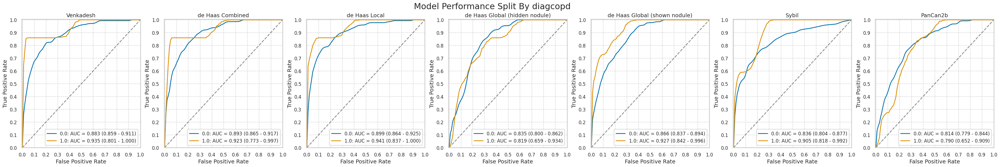

diagdiab


,num,pct,num_mal,pct_mal
0.0,1656,88.038278,116,7.004831
1.0,225,11.961722,22,9.777778


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1656,108,567,973,8,0.931034,0.368182,0.068966,0.631818,0.160000,0.991845,0.840000,0.008155,0.652778
1.0,225,16,61,142,6,0.727273,0.300493,0.272727,0.699507,0.207792,0.959459,0.792208,0.040541,0.702222


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1656,110,671,869,6,0.948276,0.435714,0.051724,0.564286,0.140845,0.993143,0.859155,0.006857,0.591184
1.0,225,20,80,123,2,0.909091,0.394089,0.090909,0.605911,0.200000,0.984000,0.800000,0.016000,0.635556


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1656,112,706,834,4,0.965517,0.458442,0.034483,0.541558,0.136919,0.995227,0.863081,0.004773,0.571256
1.0,225,20,74,129,2,0.909091,0.364532,0.090909,0.635468,0.212766,0.984733,0.787234,0.015267,0.662222


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1656,108,679,861,8,0.931034,0.440909,0.068966,0.559091,0.137230,0.990794,0.862770,0.009206,0.585145
1.0,225,21,69,134,1,0.954545,0.339901,0.045455,0.660099,0.233333,0.992593,0.766667,0.007407,0.688889


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1656,87,355,1185,29,0.750000,0.230519,0.250000,0.769481,0.196833,0.976112,0.803167,0.023888,0.768116
1.0,225,17,31,172,5,0.772727,0.152709,0.227273,0.847291,0.354167,0.971751,0.645833,0.028249,0.840000


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1656,93,401,1139,23,0.801724,0.260390,0.198276,0.739610,0.188259,0.980207,0.811741,0.019793,0.743961
1.0,225,16,47,156,6,0.727273,0.231527,0.272727,0.768473,0.253968,0.962963,0.746032,0.037037,0.764444


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1656,102,707,833,14,0.879310,0.459091,0.120690,0.540909,0.126082,0.983471,0.873918,0.016529,0.564614
1.0,225,20,83,120,2,0.909091,0.408867,0.090909,0.591133,0.194175,0.983607,0.805825,0.016393,0.622222


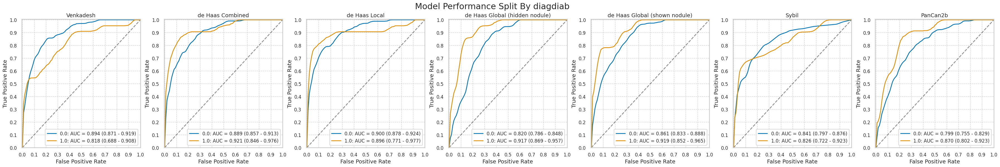

diagemph


,num,pct,num_mal,pct_mal
0.0,1647,87.746404,122,7.407407
1.0,230,12.253596,16,6.956522


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1647,110,526,999,12,0.901639,0.344918,0.098361,0.655082,0.172956,0.988131,0.827044,0.011869,0.673345
1.0,230,14,101,113,2,0.875000,0.471963,0.125000,0.528037,0.121739,0.982609,0.878261,0.017391,0.552174


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1647,114,652,873,8,0.934426,0.427541,0.065574,0.572459,0.148825,0.990919,0.851175,0.009081,0.599271
1.0,230,16,99,115,0,1.000000,0.462617,0.000000,0.537383,0.139130,1.000000,0.860870,0.000000,0.569565


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1647,116,679,846,6,0.95082,0.445246,0.04918,0.554754,0.145912,0.992958,0.854088,0.007042,0.584092
1.0,230,16,99,115,0,1.00000,0.462617,0.00000,0.537383,0.139130,1.000000,0.860870,0.000000,0.569565


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1647,114,647,878,8,0.934426,0.424262,0.065574,0.575738,0.149803,0.990971,0.850197,0.009029,0.602307
1.0,230,15,101,113,1,0.937500,0.471963,0.062500,0.528037,0.129310,0.991228,0.870690,0.008772,0.556522


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1647,91,340,1185,31,0.745902,0.222951,0.254098,0.777049,0.211137,0.974507,0.788863,0.025493,0.774742
1.0,230,13,46,168,3,0.812500,0.214953,0.187500,0.785047,0.220339,0.982456,0.779661,0.017544,0.786957


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1647,94,358,1167,28,0.770492,0.234754,0.229508,0.765246,0.207965,0.976569,0.792035,0.023431,0.765634
1.0,230,15,90,124,1,0.937500,0.420561,0.062500,0.579439,0.142857,0.992000,0.857143,0.008000,0.604348


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1647,107,676,849,15,0.877049,0.443279,0.122951,0.556721,0.136654,0.982639,0.863346,0.017361,0.580449
1.0,230,15,111,103,1,0.937500,0.518692,0.062500,0.481308,0.119048,0.990385,0.880952,0.009615,0.513043


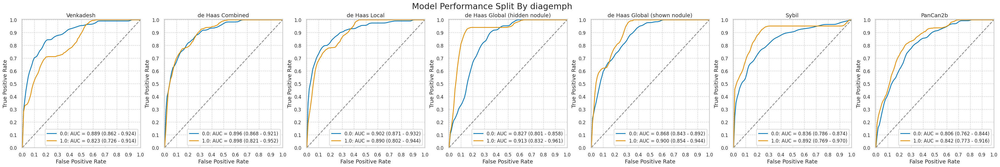

diagfibr


,num,pct,num_mal,pct_mal
0.0,1873,99.574694,138,7.367859
1.0,8,0.425306,0,0.000000


Not plotting ROC since there are zero values for malignant or benign nodules :(
diaghear


,num,pct,num_mal,pct_mal
0.0,1621,86.407249,122,7.526218
1.0,255,13.592751,16,6.274510


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1621,110,524,975,12,0.901639,0.349566,0.098361,0.650434,0.173502,0.987842,0.826498,0.012158,0.669340
1.0,255,14,104,135,2,0.875000,0.435146,0.125000,0.564854,0.118644,0.985401,0.881356,0.014599,0.584314


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1621,115,655,844,7,0.942623,0.436958,0.057377,0.563042,0.149351,0.991774,0.850649,0.008226,0.591610
1.0,255,15,96,143,1,0.937500,0.401674,0.062500,0.598326,0.135135,0.993056,0.864865,0.006944,0.619608


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1621,117,661,838,5,0.959016,0.440961,0.040984,0.559039,0.150386,0.994069,0.849614,0.005931,0.589143
1.0,255,15,118,121,1,0.937500,0.493724,0.062500,0.506276,0.112782,0.991803,0.887218,0.008197,0.533333


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1621,113,648,851,9,0.92623,0.432288,0.07377,0.567712,0.148489,0.989535,0.851511,0.010465,0.594695
1.0,255,16,99,140,0,1.00000,0.414226,0.00000,0.585774,0.139130,1.000000,0.860870,0.000000,0.611765


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1621,88,342,1157,34,0.721311,0.228152,0.278689,0.771848,0.204651,0.971453,0.795349,0.028547,0.768044
1.0,255,16,43,196,0,1.000000,0.179916,0.000000,0.820084,0.271186,1.000000,0.728814,0.000000,0.831373


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1621,96,377,1122,26,0.786885,0.251501,0.213115,0.748499,0.202960,0.977352,0.797040,0.022648,0.751388
1.0,255,13,71,168,3,0.812500,0.297071,0.187500,0.702929,0.154762,0.982456,0.845238,0.017544,0.709804


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1621,107,672,827,15,0.877049,0.448299,0.122951,0.551701,0.137356,0.982185,0.862644,0.017815,0.576188
1.0,255,15,114,125,1,0.937500,0.476987,0.062500,0.523013,0.116279,0.992063,0.883721,0.007937,0.549020


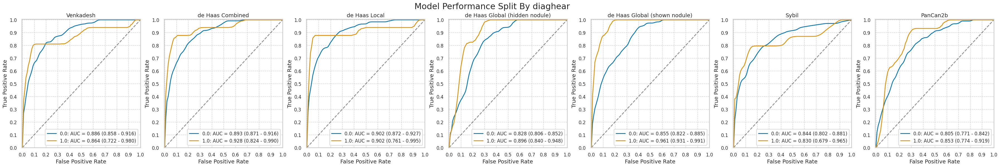

diaghype


,num,pct,num_mal,pct_mal
0.0,1237,65.903037,86,6.952304
1.0,640,34.096963,49,7.656250


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1237,79,421,730,7,0.918605,0.365769,0.081395,0.634231,0.158000,0.990502,0.842000,0.009498,0.654002
1.0,640,42,207,384,7,0.857143,0.350254,0.142857,0.649746,0.168675,0.982097,0.831325,0.017903,0.665625


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1237,82,469,682,4,0.953488,0.407472,0.046512,0.592528,0.148820,0.994169,0.851180,0.005831,0.617623
1.0,640,45,282,309,4,0.918367,0.477157,0.081633,0.522843,0.137615,0.987220,0.862385,0.012780,0.553125


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1237,82,526,625,4,0.953488,0.456994,0.046512,0.543006,0.134868,0.993641,0.865132,0.006359,0.571544
1.0,640,47,254,337,2,0.959184,0.429780,0.040816,0.570220,0.156146,0.994100,0.843854,0.005900,0.600000


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1237,79,471,680,7,0.918605,0.409209,0.081395,0.590791,0.143636,0.989811,0.856364,0.010189,0.613581
1.0,640,47,276,315,2,0.959184,0.467005,0.040816,0.532995,0.145511,0.993691,0.854489,0.006309,0.565625


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1237,64,242,909,22,0.744186,0.210252,0.255814,0.789748,0.209150,0.976369,0.790850,0.023631,0.786580
1.0,640,37,143,448,12,0.755102,0.241963,0.244898,0.758037,0.205556,0.973913,0.794444,0.026087,0.757812


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1237,67,298,853,19,0.779070,0.258905,0.220930,0.741095,0.183562,0.978211,0.816438,0.021789,0.743735
1.0,640,39,150,441,10,0.795918,0.253807,0.204082,0.746193,0.206349,0.977827,0.793651,0.022173,0.750000


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1237,74,527,624,12,0.860465,0.457863,0.139535,0.542137,0.123128,0.981132,0.876872,0.018868,0.564268
1.0,640,45,262,329,4,0.918367,0.443316,0.081633,0.556684,0.146580,0.987988,0.853420,0.012012,0.584375


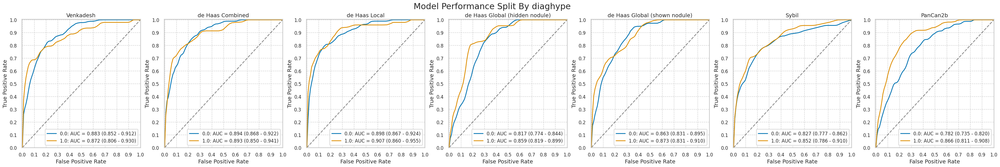

diagpneu


,num,pct,num_mal,pct_mal
0.0,1446,76.874003,111,7.676349
1.0,435,23.125997,27,6.206897


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1446,99,462,873,12,0.891892,0.346067,0.108108,0.653933,0.176471,0.986441,0.823529,0.013559,0.672199
1.0,435,25,166,242,2,0.925926,0.406863,0.074074,0.593137,0.130890,0.991803,0.869110,0.008197,0.613793


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1446,106,579,756,5,0.954955,0.433708,0.045045,0.566292,0.154745,0.993430,0.845255,0.006570,0.596127
1.0,435,24,172,236,3,0.888889,0.421569,0.111111,0.578431,0.122449,0.987448,0.877551,0.012552,0.597701


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1446,105,580,755,6,0.945946,0.434457,0.054054,0.565543,0.153285,0.992116,0.846715,0.007884,0.594744
1.0,435,27,200,208,0,1.000000,0.490196,0.000000,0.509804,0.118943,1.000000,0.881057,0.000000,0.540230


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1446,106,544,791,5,0.954955,0.407491,0.045045,0.592509,0.163077,0.993719,0.836923,0.006281,0.620332
1.0,435,23,204,204,4,0.851852,0.500000,0.148148,0.500000,0.101322,0.980769,0.898678,0.019231,0.521839


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1446,86,273,1062,25,0.774775,0.204494,0.225225,0.795506,0.239554,0.977001,0.760446,0.022999,0.793914
1.0,435,18,113,295,9,0.666667,0.276961,0.333333,0.723039,0.137405,0.970395,0.862595,0.029605,0.719540


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1446,90,306,1029,21,0.810811,0.229213,0.189189,0.770787,0.227273,0.980000,0.772727,0.020000,0.773859
1.0,435,19,142,266,8,0.703704,0.348039,0.296296,0.651961,0.118012,0.970803,0.881988,0.029197,0.655172


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1446,98,563,772,13,0.882883,0.421723,0.117117,0.578277,0.148260,0.983439,0.851740,0.016561,0.601660
1.0,435,24,227,181,3,0.888889,0.556373,0.111111,0.443627,0.095618,0.983696,0.904382,0.016304,0.471264


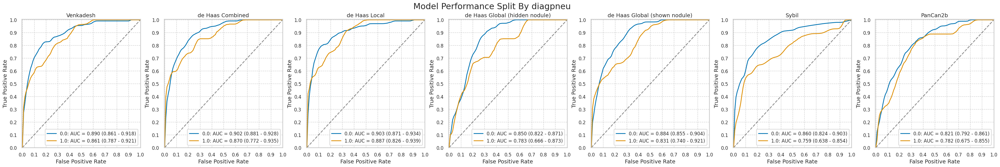

diagsarc


,num,pct,num_mal,pct_mal
0.0,1879,99.893674,137,7.291112
1.0,2,0.106326,1,50.000000


Not plotting ROC since there are zero values for malignant or benign nodules :(
diagsili


,num,pct,num_mal,pct_mal
0.0,1878,99.84051,138,7.348243
1.0,3,0.15949,0,0.000000


Not plotting ROC since there are zero values for malignant or benign nodules :(
diagstro


,num,pct,num_mal,pct_mal
0.0,1820,96.757044,126,6.923077
1.0,61,3.242956,12,19.672131


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1820,115,617,1077,11,0.912698,0.364227,0.087302,0.635773,0.157104,0.989890,0.842896,0.010110,0.654945
1.0,61,9,11,38,3,0.750000,0.224490,0.250000,0.775510,0.450000,0.926829,0.550000,0.073171,0.770492


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1820,119,726,968,7,0.944444,0.428571,0.055556,0.571429,0.140828,0.992821,0.859172,0.007179,0.597253
1.0,61,11,25,24,1,0.916667,0.510204,0.083333,0.489796,0.305556,0.960000,0.694444,0.040000,0.573770


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1820,121,758,936,5,0.960317,0.447462,0.039683,0.552538,0.137656,0.994687,0.862344,0.005313,0.580769
1.0,61,11,22,27,1,0.916667,0.448980,0.083333,0.551020,0.333333,0.964286,0.666667,0.035714,0.622951


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1820,117,720,974,9,0.928571,0.425030,0.071429,0.574970,0.139785,0.990844,0.860215,0.009156,0.599451
1.0,61,12,28,21,0,1.000000,0.571429,0.000000,0.428571,0.300000,1.000000,0.700000,0.000000,0.540984


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1820,96,369,1325,30,0.761905,0.217828,0.238095,0.782172,0.206452,0.977860,0.793548,0.022140,0.780769
1.0,61,8,17,32,4,0.666667,0.346939,0.333333,0.653061,0.320000,0.888889,0.680000,0.111111,0.655738


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1820,99,431,1263,27,0.785714,0.254427,0.214286,0.745573,0.186792,0.979070,0.813208,0.020930,0.748352
1.0,61,10,17,32,2,0.833333,0.346939,0.166667,0.653061,0.370370,0.941176,0.629630,0.058824,0.688525


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1820,112,765,929,14,0.888889,0.451594,0.111111,0.548406,0.127708,0.985154,0.872292,0.014846,0.571978
1.0,61,10,25,24,2,0.833333,0.510204,0.166667,0.489796,0.285714,0.923077,0.714286,0.076923,0.557377


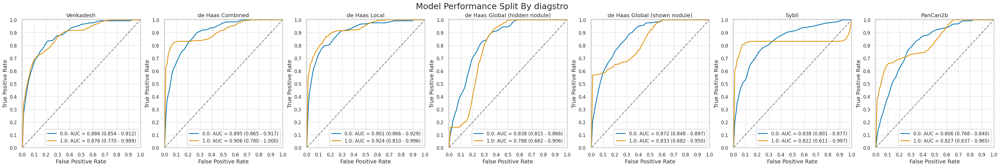

diagtube


,num,pct,num_mal,pct_mal
0.0,1843,97.979798,138,7.487792
1.0,38,2.020202,0,0.000000


Not plotting ROC since there are zero values for malignant or benign nodules :(


In [20]:
for cat in nlst_democols['cat']['disease']:
    print(cat)
    plot_by_category(nlst_preds, cat)

## Binning for numerical columns

### Demographic columns

height


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1743.0,68.119908,3.744260,59.0,66.0,68.0,71.0,78.0
1,138.0,68.297101,3.707183,60.0,66.0,69.0,71.0,76.0


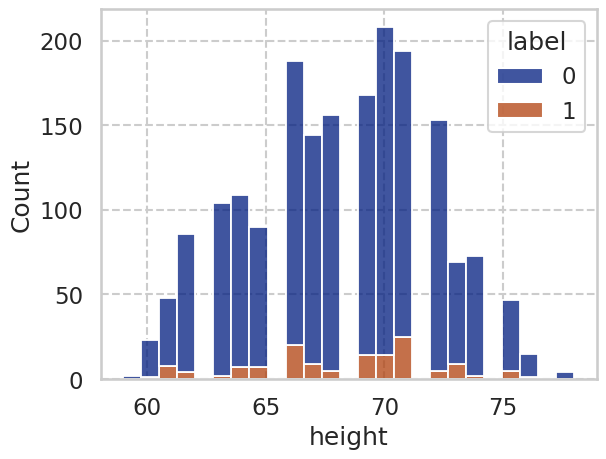

weight


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1742.0,183.963261,40.549242,90.0,160.00,180.0,210.0,315.0
1,138.0,178.326087,35.805061,108.0,157.75,180.0,204.0,322.0


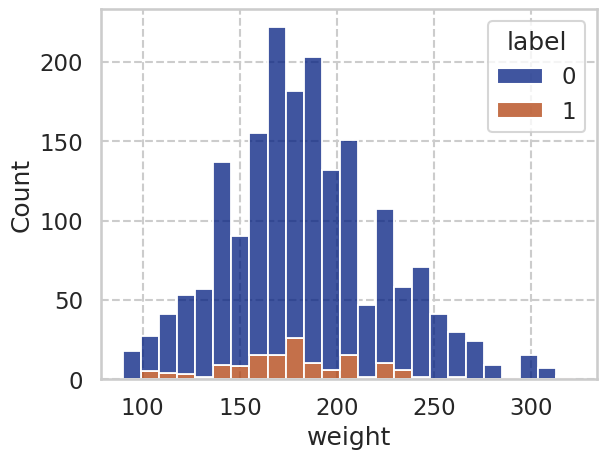

Age


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1743.0,63.542742,5.454570,55.0,59.00,63.0,67.0,76.0
1,138.0,64.079710,5.161709,55.0,60.25,63.0,68.0,75.0


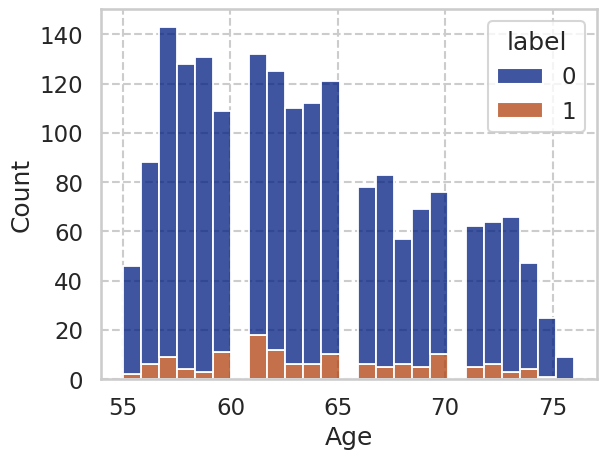

In [21]:
for c in nlst_democols['num']['demo']:
    print(c)
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

,count,mean,std,min,25%,50%,75%,max
bin_Age,,,,,,,,
"[55, 60)",536.0,0.044776,0.207005,0.0,0.0,0.0,0.0,1.0
"[60, 65)",588.0,0.090136,0.286620,0.0,0.0,0.0,0.0,1.0
"[65, 70)",408.0,0.078431,0.269179,0.0,0.0,0.0,0.0,1.0
"[70, 78)",349.0,0.083095,0.276421,0.0,0.0,0.0,0.0,1.0


,num,pct,num_mal,pct_mal
"[55, 60)",536,28.495481,24,4.477612
"[60, 65)",588,31.259968,53,9.013605
"[65, 70)",408,21.690590,32,7.843137
"[70, 78)",349,18.553961,29,8.309456


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"[55, 60)",536,22,179,333,2,0.916667,0.349609,0.083333,0.650391,0.109453,0.994030,0.890547,0.005970,0.662313
"[60, 65)",588,47,187,348,6,0.886792,0.349533,0.113208,0.650467,0.200855,0.983051,0.799145,0.016949,0.671769
"[65, 70)",408,28,141,235,4,0.875000,0.375000,0.125000,0.625000,0.165680,0.983264,0.834320,0.016736,0.644608
"[70, 78)",349,27,121,199,2,0.931034,0.378125,0.068966,0.621875,0.182432,0.990050,0.817568,0.009950,0.647564


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"[55, 60)",536,23,250,262,1,0.958333,0.488281,0.041667,0.511719,0.084249,0.996198,0.915751,0.003802,0.531716
"[60, 65)",588,47,210,325,6,0.886792,0.392523,0.113208,0.607477,0.182879,0.981873,0.817121,0.018127,0.632653
"[65, 70)",408,31,138,238,1,0.968750,0.367021,0.031250,0.632979,0.183432,0.995816,0.816568,0.004184,0.659314
"[70, 78)",349,29,153,167,0,1.000000,0.478125,0.000000,0.521875,0.159341,1.000000,0.840659,0.000000,0.561605


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"[55, 60)",536,23,221,291,1,0.958333,0.431641,0.041667,0.568359,0.094262,0.996575,0.905738,0.003425,0.585821
"[60, 65)",588,50,220,315,3,0.943396,0.411215,0.056604,0.588785,0.185185,0.990566,0.814815,0.009434,0.620748
"[65, 70)",408,30,185,191,2,0.937500,0.492021,0.062500,0.507979,0.139535,0.989637,0.860465,0.010363,0.541667
"[70, 78)",349,29,154,166,0,1.000000,0.481250,0.000000,0.518750,0.158470,1.000000,0.841530,0.000000,0.558739


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"[55, 60)",536,23,232,280,1,0.958333,0.453125,0.041667,0.546875,0.090196,0.996441,0.909804,0.003559,0.565299
"[60, 65)",588,50,229,306,3,0.943396,0.428037,0.056604,0.571963,0.179211,0.990291,0.820789,0.009709,0.605442
"[65, 70)",408,30,163,213,2,0.937500,0.433511,0.062500,0.566489,0.155440,0.990698,0.844560,0.009302,0.595588
"[70, 78)",349,26,124,196,3,0.896552,0.387500,0.103448,0.612500,0.173333,0.984925,0.826667,0.015075,0.636103


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"[55, 60)",536,18,108,404,6,0.750000,0.210938,0.250000,0.789062,0.142857,0.985366,0.857143,0.014634,0.787313
"[60, 65)",588,41,128,407,12,0.773585,0.239252,0.226415,0.760748,0.242604,0.971360,0.757396,0.028640,0.761905
"[65, 70)",408,23,84,292,9,0.718750,0.223404,0.281250,0.776596,0.214953,0.970100,0.785047,0.029900,0.772059
"[70, 78)",349,22,66,254,7,0.758621,0.206250,0.241379,0.793750,0.250000,0.973180,0.750000,0.026820,0.790831


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"[55, 60)",536,19,105,407,5,0.791667,0.205078,0.208333,0.794922,0.153226,0.987864,0.846774,0.012136,0.794776
"[60, 65)",588,39,137,398,14,0.735849,0.256075,0.264151,0.743925,0.221591,0.966019,0.778409,0.033981,0.743197
"[65, 70)",408,29,105,271,3,0.906250,0.279255,0.093750,0.720745,0.216418,0.989051,0.783582,0.010949,0.735294
"[70, 78)",349,22,101,219,7,0.758621,0.315625,0.241379,0.684375,0.178862,0.969027,0.821138,0.030973,0.690544


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"[55, 60)",536,21,206,306,3,0.875000,0.402344,0.125000,0.597656,0.092511,0.990291,0.907489,0.009709,0.610075
"[60, 65)",588,45,245,290,8,0.849057,0.457944,0.150943,0.542056,0.155172,0.973154,0.844828,0.026846,0.569728
"[65, 70)",408,30,170,206,2,0.937500,0.452128,0.062500,0.547872,0.150000,0.990385,0.850000,0.009615,0.578431
"[70, 78)",349,26,169,151,3,0.896552,0.528125,0.103448,0.471875,0.133333,0.980519,0.866667,0.019481,0.507163


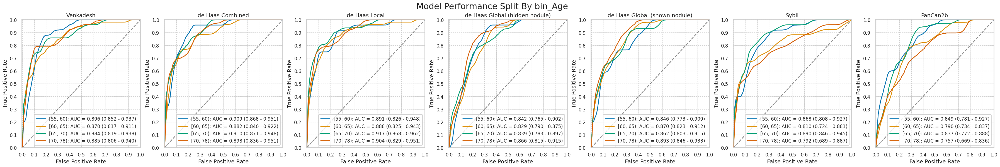

,num,pct,num_mal,pct_mal
"[55, 60)",536,28.495481,24,4.477612
"[60, 65)",588,31.259968,53,9.013605
"[65, 70)",408,21.690590,32,7.843137
"[70, 78)",349,18.553961,29,8.309456


In [22]:
nlst_preds['bin_Age'] = pd.cut(nlst_preds['Age'], bins=[55, 60, 65, 70, 78], right=False)
display(nlst_preds.groupby('bin_Age')['label'].describe())
plot_by_category(nlst_preds, f'bin_Age')

label                                              height  \
            count      mean       std  min  25%  50%  75%  max  count   
bin_height                                                              
(48, 68]    950.0  0.066316  0.248964  0.0  0.0  0.0  0.0  1.0  950.0   
(68, 88]    931.0  0.080559  0.272302  0.0  0.0  0.0  0.0  1.0  931.0   

                                                               
                 mean       std   min   25%   50%   75%   max  
bin_height                                                     
(48, 68]    65.052632  2.267507  59.0  63.0  66.0  67.0  68.0  
(68, 88]    71.276047  1.860181  69.0  70.0  71.0  72.0  78.0

,num,pct,num_mal,pct_mal
"(48, 68]",950,50.505051,63,6.631579
"(68, 88]",931,49.494949,75,8.055854


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(48, 68]",950,53,333,554,10,0.841270,0.375423,0.158730,0.624577,0.137306,0.98227,0.862694,0.01773,0.638947
"(68, 88]",931,71,295,561,4,0.946667,0.344626,0.053333,0.655374,0.193989,0.99292,0.806011,0.00708,0.678840


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(48, 68]",950,58,405,482,5,0.920635,0.456595,0.079365,0.543405,0.125270,0.989733,0.874730,0.010267,0.568421
"(68, 88]",931,72,346,510,3,0.960000,0.404206,0.040000,0.595794,0.172249,0.994152,0.827751,0.005848,0.625134


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(48, 68]",950,61,409,478,2,0.968254,0.461105,0.031746,0.538895,0.129787,0.995833,0.870213,0.004167,0.567368
"(68, 88]",931,71,371,485,4,0.946667,0.433411,0.053333,0.566589,0.160633,0.991820,0.839367,0.008180,0.597207


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(48, 68]",950,60,425,462,3,0.952381,0.479143,0.047619,0.520857,0.123711,0.993548,0.876289,0.006452,0.549474
"(68, 88]",931,69,323,533,6,0.920000,0.377336,0.080000,0.622664,0.176020,0.988868,0.823980,0.011132,0.646617


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(48, 68]",950,47,205,682,16,0.746032,0.231116,0.253968,0.768884,0.186508,0.977077,0.813492,0.022923,0.767368
"(68, 88]",931,57,181,675,18,0.760000,0.211449,0.240000,0.788551,0.239496,0.974026,0.760504,0.025974,0.786251


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(48, 68]",950,54,224,663,9,0.857143,0.252537,0.142857,0.747463,0.194245,0.986607,0.805755,0.013393,0.754737
"(68, 88]",931,55,224,632,20,0.733333,0.261682,0.266667,0.738318,0.197133,0.969325,0.802867,0.030675,0.737916


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(48, 68]",950,54,440,447,9,0.857143,0.496054,0.142857,0.503946,0.109312,0.980263,0.890688,0.019737,0.527368
"(68, 88]",931,68,350,506,7,0.906667,0.408879,0.093333,0.591121,0.162679,0.986355,0.837321,0.013645,0.616541


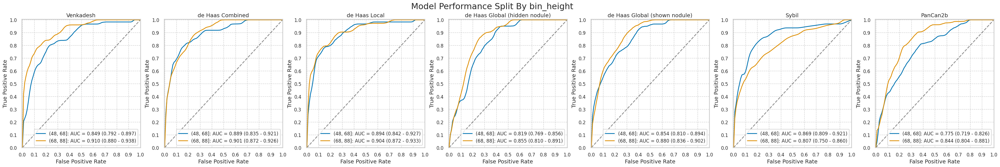

,num,pct,num_mal,pct_mal
"(48, 68]",950,50.505051,63,6.631579
"(68, 88]",931,49.494949,75,8.055854


In [23]:
nlst_preds['bin_height'] = pd.cut(nlst_preds['height'], bins=[48, 68, 88], right=True)
display(nlst_preds.groupby('bin_height')[['label', 'height']].describe())
plot_by_category(nlst_preds, f'bin_height')

label                                              weight  \
            count      mean       std  min  25%  50%  75%  max  count   
bin_weight                                                              
(79, 179]   910.0  0.071429  0.257681  0.0  0.0  0.0  0.0  1.0  910.0   
(179, 279]  936.0  0.075855  0.264907  0.0  0.0  0.0  0.0  1.0  936.0   

                                                                      
                  mean        std    min    25%    50%    75%    max  
bin_weight                                                            
(79, 179]   151.202198  20.804152   90.0  140.0  157.0  169.0  178.0  
(179, 279]  210.861111  24.309192  180.0  190.0  205.0  226.0  275.0

,num,pct,num_mal,pct_mal
"(79, 179]",910,49.295775,65,7.142857
"(179, 279]",936,50.704225,71,7.585470


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(79, 179]",910,59,335,510,6,0.907692,0.396450,0.092308,0.603550,0.149746,0.988372,0.850254,0.011628,0.625275
"(179, 279]",936,64,281,584,7,0.901408,0.324855,0.098592,0.675145,0.185507,0.988156,0.814493,0.011844,0.692308


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(79, 179]",910,63,399,446,2,0.969231,0.472189,0.030769,0.527811,0.136364,0.995536,0.863636,0.004464,0.559341
"(179, 279]",936,65,346,519,6,0.915493,0.400000,0.084507,0.600000,0.158151,0.988571,0.841849,0.011429,0.623932


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(79, 179]",910,64,407,438,1,0.984615,0.481657,0.015385,0.518343,0.135881,0.997722,0.864119,0.002278,0.551648
"(179, 279]",936,66,352,513,5,0.929577,0.406936,0.070423,0.593064,0.157895,0.990347,0.842105,0.009653,0.618590


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(79, 179]",910,63,406,439,2,0.969231,0.480473,0.030769,0.519527,0.134328,0.995465,0.865672,0.004535,0.551648
"(179, 279]",936,64,340,525,7,0.901408,0.393064,0.098592,0.606936,0.158416,0.986842,0.841584,0.013158,0.629274


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(79, 179]",910,54,220,625,11,0.830769,0.260355,0.169231,0.739645,0.197080,0.982704,0.802920,0.017296,0.746154
"(179, 279]",936,48,163,702,23,0.676056,0.188439,0.323944,0.811561,0.227488,0.968276,0.772512,0.031724,0.801282


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(79, 179]",910,55,204,641,10,0.846154,0.241420,0.153846,0.758580,0.212355,0.984639,0.787645,0.015361,0.764835
"(179, 279]",936,53,232,633,18,0.746479,0.268208,0.253521,0.731792,0.185965,0.972350,0.814035,0.027650,0.732906


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(79, 179]",910,58,425,420,7,0.892308,0.502959,0.107692,0.497041,0.120083,0.983607,0.879917,0.016393,0.525275
"(179, 279]",936,62,352,513,9,0.873239,0.406936,0.126761,0.593064,0.149758,0.982759,0.850242,0.017241,0.614316


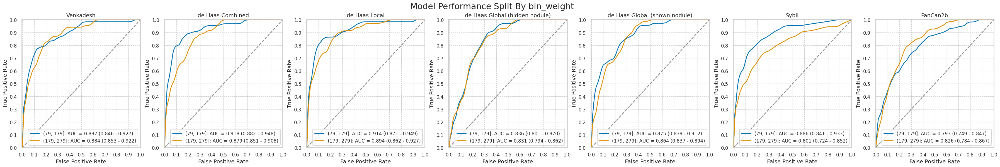

,num,pct,num_mal,pct_mal
"(79, 179]",910,49.295775,65,7.142857
"(179, 279]",936,50.704225,71,7.585470


In [24]:
nlst_preds['bin_weight'] = pd.cut(nlst_preds['weight'], bins=[79, 179, 279], right=True)
display(nlst_preds.groupby('bin_weight')[['label', 'weight']].describe())
plot_by_category(nlst_preds, f'bin_weight')

### Smoking columns

pkyr


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1743.0,57.264659,22.600278,30.0,40.25,50.0,66.750,162.0
1,138.0,69.943116,28.919971,30.0,50.00,64.5,85.125,224.0


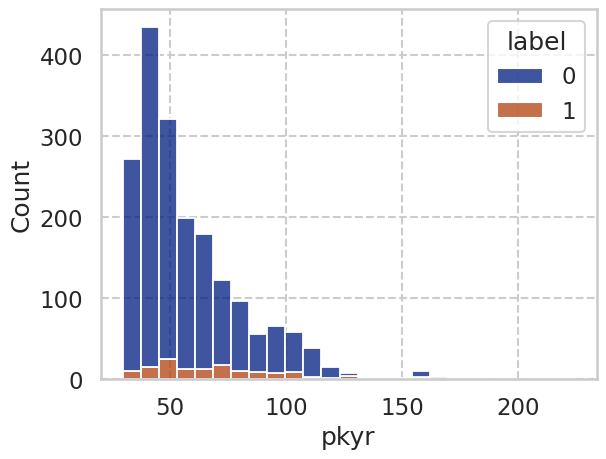

smokeage


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1743.0,16.434309,3.364759,5.0,14.0,16.0,18.0,40.0
1,138.0,16.152174,3.187343,8.0,14.0,16.0,18.0,26.0


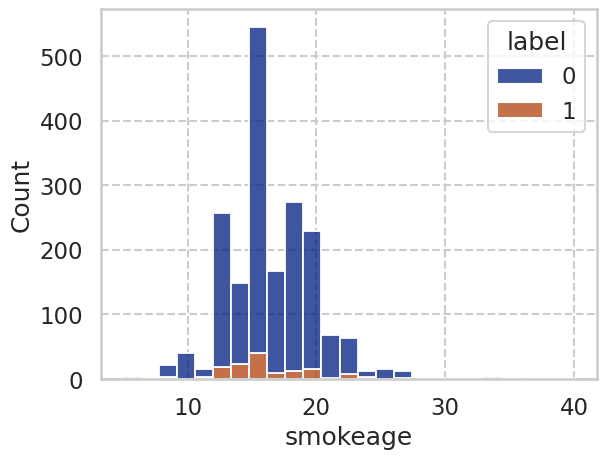

smokeday


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1743.0,28.598394,12.335738,12.0,20.0,25.0,32.0,80.0
1,138.0,31.601449,11.810264,18.0,20.0,30.0,40.0,80.0


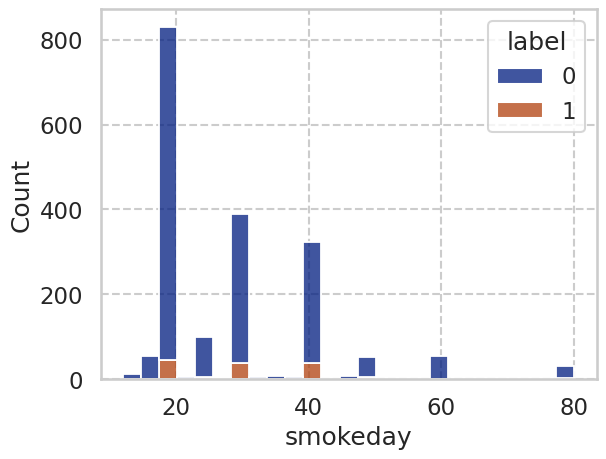

smokeyr


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1743.0,41.164085,7.836924,17.0,36.0,41.0,46.0,61.0
1,138.0,44.260870,7.042420,29.0,39.0,44.0,49.0,65.0


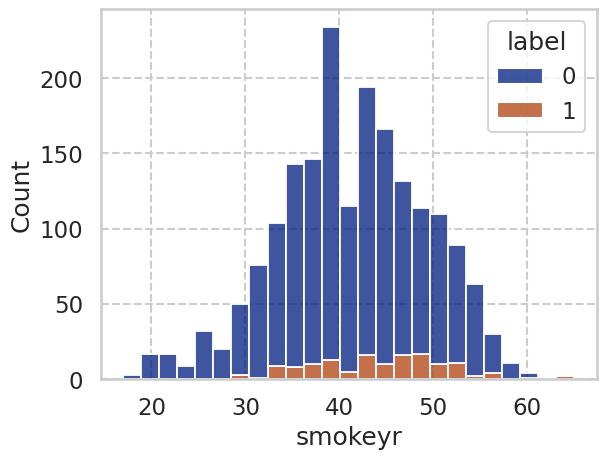

In [25]:
for c in nlst_democols['num']['smoke']:
    print(c)
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

label                                                pkyr  \
                count      mean       std  min  25%  50%  75%  max  count   
bin_pkyr                                                                    
(29.999, 51.0]  945.0  0.044444  0.206190  0.0  0.0  0.0  0.0  1.0  945.0   
(51.0, 224.0]   936.0  0.102564  0.303551  0.0  0.0  0.0  0.0  1.0  936.0   

                                                                      
                     mean        std    min   25%   50%   75%    max  
bin_pkyr                                                              
(29.999, 51.0]  41.004656   5.675120  30.00  37.0  41.0  45.9   51.0  
(51.0, 224.0]   75.550267  21.527655  51.25  59.0  69.0  88.0  224.0

,num,pct,num_mal,pct_mal
"(29.999, 51.0]",945,50.239234,42,4.444444
"(51.0, 224.0]",936,49.760766,96,10.256410


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(29.999, 51.0]",945,35,310,593,7,0.833333,0.343300,0.166667,0.656700,0.101449,0.988333,0.898551,0.011667,0.664550
"(51.0, 224.0]",936,89,318,522,7,0.927083,0.378571,0.072917,0.621429,0.218673,0.986767,0.781327,0.013233,0.652778


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(29.999, 51.0]",945,39,405,498,3,0.928571,0.448505,0.071429,0.551495,0.087838,0.994012,0.912162,0.005988,0.568254
"(51.0, 224.0]",936,91,346,494,5,0.947917,0.411905,0.052083,0.588095,0.208238,0.989980,0.791762,0.010020,0.625000


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(29.999, 51.0]",945,41,392,511,1,0.976190,0.434109,0.023810,0.565891,0.094688,0.998047,0.905312,0.001953,0.584127
"(51.0, 224.0]",936,91,388,452,5,0.947917,0.461905,0.052083,0.538095,0.189979,0.989059,0.810021,0.010941,0.580128


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(29.999, 51.0]",945,36,402,501,6,0.857143,0.445183,0.142857,0.554817,0.082192,0.988166,0.917808,0.011834,0.568254
"(51.0, 224.0]",936,93,346,494,3,0.968750,0.411905,0.031250,0.588095,0.211845,0.993964,0.788155,0.006036,0.627137


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(29.999, 51.0]",945,32,187,716,10,0.761905,0.207087,0.238095,0.792913,0.146119,0.986226,0.853881,0.013774,0.791534
"(51.0, 224.0]",936,72,199,641,24,0.750000,0.236905,0.250000,0.763095,0.265683,0.963910,0.734317,0.036090,0.761752


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(29.999, 51.0]",945,32,250,653,10,0.761905,0.276855,0.238095,0.723145,0.113475,0.984917,0.886525,0.015083,0.724868
"(51.0, 224.0]",936,77,198,642,19,0.802083,0.235714,0.197917,0.764286,0.280000,0.971256,0.720000,0.028744,0.768162


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(29.999, 51.0]",945,38,390,513,4,0.904762,0.431894,0.095238,0.568106,0.088785,0.992263,0.911215,0.007737,0.583069
"(51.0, 224.0]",936,84,400,440,12,0.875000,0.476190,0.125000,0.523810,0.173554,0.973451,0.826446,0.026549,0.559829


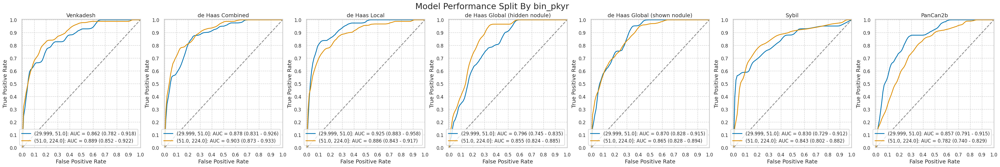

label                                              smokeage  \
                count      mean       std  min  25%  50%  75%  max    count   
bin_smokeage                                                                  
(4.999, 16.0]  1031.0  0.084384  0.278098  0.0  0.0  0.0  0.0  1.0   1031.0   
(16.0, 40.0]    850.0  0.060000  0.237627  0.0  0.0  0.0  0.0  1.0    850.0   

                                                                  
                    mean       std   min   25%   50%   75%   max  
bin_smokeage                                                      
(4.999, 16.0]  14.068865  1.860189   5.0  13.0  15.0  15.0  16.0  
(16.0, 40.0]   19.257647  2.430803  17.0  18.0  18.0  20.0  40.0

,num,pct,num_mal,pct_mal
"(4.999, 16.0]",1031,54.811271,87,8.438409
"(16.0, 40.0]",850,45.188729,51,6.000000


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(4.999, 16.0]",1031,80,363,581,7,0.919540,0.384534,0.080460,0.615466,0.180587,0.988095,0.819413,0.011905,0.641125
"(16.0, 40.0]",850,44,265,534,7,0.862745,0.331665,0.137255,0.668335,0.142395,0.987061,0.857605,0.012939,0.680000


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(4.999, 16.0]",1031,80,413,531,7,0.919540,0.437500,0.080460,0.562500,0.162272,0.986989,0.837728,0.013011,0.592629
"(16.0, 40.0]",850,50,338,461,1,0.980392,0.423029,0.019608,0.576971,0.128866,0.997835,0.871134,0.002165,0.601176


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(4.999, 16.0]",1031,82,437,507,5,0.942529,0.462924,0.057471,0.537076,0.157996,0.990234,0.842004,0.009766,0.571290
"(16.0, 40.0]",850,50,343,456,1,0.980392,0.429287,0.019608,0.570713,0.127226,0.997812,0.872774,0.002188,0.595294


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(4.999, 16.0]",1031,79,403,541,8,0.908046,0.426907,0.091954,0.573093,0.163900,0.985428,0.836100,0.014572,0.601358
"(16.0, 40.0]",850,50,345,454,1,0.980392,0.431790,0.019608,0.568210,0.126582,0.997802,0.873418,0.002198,0.592941


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(4.999, 16.0]",1031,63,243,701,24,0.724138,0.257415,0.275862,0.742585,0.205882,0.966897,0.794118,0.033103,0.741028
"(16.0, 40.0]",850,41,143,656,10,0.803922,0.178974,0.196078,0.821026,0.222826,0.984985,0.777174,0.015015,0.820000


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(4.999, 16.0]",1031,71,225,719,16,0.816092,0.238347,0.183908,0.761653,0.239865,0.978231,0.760135,0.021769,0.766246
"(16.0, 40.0]",850,38,223,576,13,0.745098,0.279099,0.254902,0.720901,0.145594,0.977929,0.854406,0.022071,0.722353


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(4.999, 16.0]",1031,74,451,493,13,0.850575,0.477754,0.149425,0.522246,0.140952,0.974308,0.859048,0.025692,0.549952
"(16.0, 40.0]",850,48,339,460,3,0.941176,0.424280,0.058824,0.575720,0.124031,0.993521,0.875969,0.006479,0.597647


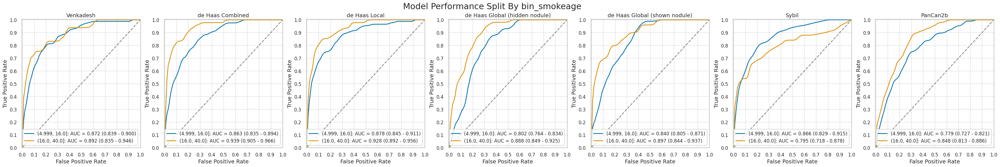

label                                              smokeday  \
                 count      mean       std  min  25%  50%  75%  max    count   
bin_smokeday                                                                   
(11.999, 25.0]  1002.0  0.049900  0.217847  0.0  0.0  0.0  0.0  1.0   1002.0   
(25.0, 80.0]     879.0  0.100114  0.300323  0.0  0.0  0.0  0.0  1.0    879.0   

                                                                    
                     mean        std   min   25%   50%   75%   max  
bin_smokeday                                                        
(11.999, 25.0]  20.078842   2.090550  12.0  20.0  20.0  20.0  25.0  
(25.0, 80.0]    38.781570  11.552695  28.0  30.0  40.0  40.0  80.0

,num,pct,num_mal,pct_mal
"(11.999, 25.0]",1002,53.269537,50,4.990020
"(25.0, 80.0]",879,46.730463,88,10.011377


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(11.999, 25.0]",1002,42,344,608,8,0.840000,0.361345,0.160000,0.638655,0.108808,0.987013,0.891192,0.012987,0.648703
"(25.0, 80.0]",879,82,284,507,6,0.931818,0.359039,0.068182,0.640961,0.224044,0.988304,0.775956,0.011696,0.670080


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(11.999, 25.0]",1002,47,443,509,3,0.940000,0.465336,0.060000,0.534664,0.095918,0.994141,0.904082,0.005859,0.554890
"(25.0, 80.0]",879,83,308,483,5,0.943182,0.389381,0.056818,0.610619,0.212276,0.989754,0.787724,0.010246,0.643914


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(11.999, 25.0]",1002,49,434,518,1,0.980000,0.455882,0.020000,0.544118,0.101449,0.998073,0.898551,0.001927,0.565868
"(25.0, 80.0]",879,83,346,445,5,0.943182,0.437421,0.056818,0.562579,0.193473,0.988889,0.806527,0.011111,0.600683


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(11.999, 25.0]",1002,43,413,539,7,0.860000,0.433824,0.140000,0.566176,0.094298,0.987179,0.905702,0.012821,0.580838
"(25.0, 80.0]",879,86,335,456,2,0.977273,0.423515,0.022727,0.576485,0.204276,0.995633,0.795724,0.004367,0.616610


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(11.999, 25.0]",1002,36,198,754,14,0.720000,0.207983,0.280000,0.792017,0.153846,0.981771,0.846154,0.018229,0.788423
"(25.0, 80.0]",879,68,188,603,20,0.772727,0.237674,0.227273,0.762326,0.265625,0.967897,0.734375,0.032103,0.763367


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(11.999, 25.0]",1002,36,261,691,14,0.720000,0.27416,0.280000,0.72584,0.121212,0.980142,0.878788,0.019858,0.725549
"(25.0, 80.0]",879,73,187,604,15,0.829545,0.23641,0.170455,0.76359,0.280769,0.975767,0.719231,0.024233,0.770193


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(11.999, 25.0]",1002,45,426,526,5,0.900,0.447479,0.100,0.552521,0.095541,0.990584,0.904459,0.009416,0.569860
"(25.0, 80.0]",879,77,364,427,11,0.875,0.460177,0.125,0.539823,0.174603,0.974886,0.825397,0.025114,0.573379


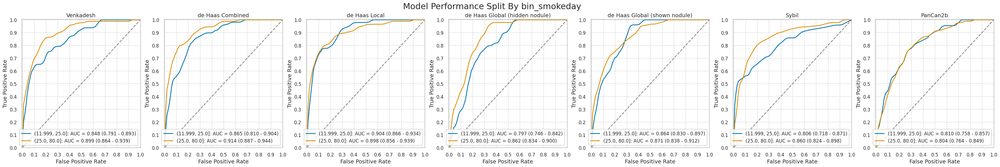

label                                              smokeyr  \
                count      mean       std  min  25%  50%  75%  max   count   
bin_smokeyr                                                                  
(16.999, 41.0]  966.0  0.050725  0.219549  0.0  0.0  0.0  0.0  1.0   966.0   
(41.0, 65.0]    915.0  0.097268  0.296484  0.0  0.0  0.0  0.0  1.0   915.0   

                                                                   
                     mean       std   min   25%   50%   75%   max  
bin_smokeyr                                                        
(16.999, 41.0]  35.434783  5.227606  17.0  33.0  37.0  40.0  41.0  
(41.0, 65.0]    47.679781  4.460031  42.0  44.0  47.0  50.0  65.0

,num,pct,num_mal,pct_mal
"(16.999, 41.0]",966,51.355662,49,5.072464
"(41.0, 65.0]",915,48.644338,89,9.726776


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(16.999, 41.0]",966,47,314,603,2,0.959184,0.342421,0.040816,0.657579,0.130194,0.996694,0.869806,0.003306,0.672878
"(41.0, 65.0]",915,77,314,512,12,0.865169,0.380145,0.134831,0.619855,0.196931,0.977099,0.803069,0.022901,0.643716


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(16.999, 41.0]",966,48,369,548,1,0.979592,0.402399,0.020408,0.597601,0.115108,0.998179,0.884892,0.001821,0.616977
"(41.0, 65.0]",915,82,382,444,7,0.921348,0.462470,0.078652,0.537530,0.176724,0.984479,0.823276,0.015521,0.574863


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(16.999, 41.0]",966,48,392,525,1,0.979592,0.427481,0.020408,0.572519,0.109091,0.998099,0.890909,0.001901,0.593168
"(41.0, 65.0]",915,84,388,438,5,0.943820,0.469734,0.056180,0.530266,0.177966,0.988713,0.822034,0.011287,0.570492


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(16.999, 41.0]",966,48,398,519,1,0.979592,0.434024,0.020408,0.565976,0.107623,0.998077,0.892377,0.001923,0.586957
"(41.0, 65.0]",915,81,350,476,8,0.910112,0.423729,0.089888,0.576271,0.187935,0.983471,0.812065,0.016529,0.608743


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(16.999, 41.0]",966,41,190,727,8,0.836735,0.207197,0.163265,0.792803,0.177489,0.989116,0.822511,0.010884,0.795031
"(41.0, 65.0]",915,63,196,630,26,0.707865,0.237288,0.292135,0.762712,0.243243,0.960366,0.756757,0.039634,0.757377


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(16.999, 41.0]",966,40,228,689,9,0.816327,0.248637,0.183673,0.751363,0.149254,0.987106,0.850746,0.012894,0.754658
"(41.0, 65.0]",915,69,220,606,20,0.775281,0.266344,0.224719,0.733656,0.238754,0.968051,0.761246,0.031949,0.737705


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(16.999, 41.0]",966,45,388,529,4,0.918367,0.423119,0.081633,0.576881,0.103926,0.992495,0.896074,0.007505,0.594203
"(41.0, 65.0]",915,77,402,424,12,0.865169,0.486683,0.134831,0.513317,0.160752,0.972477,0.839248,0.027523,0.547541


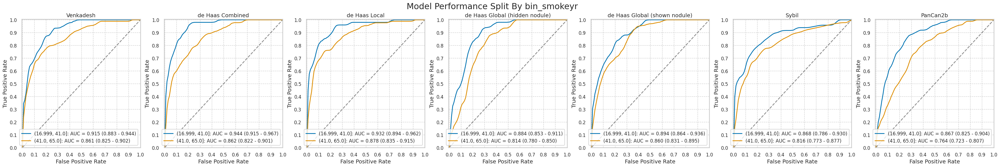

In [26]:
for c in nlst_democols['num']['smoke']:
    nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2)
    display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
    plot_by_category(nlst_preds, f'bin_{c}')

### Included columns from predictions

Diameter [mm]


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1743.0,7.589329,4.487669,4.0,4.9,6.20,8.50,44.4
1,138.0,14.774638,11.560075,4.2,7.9,11.35,17.25,83.0


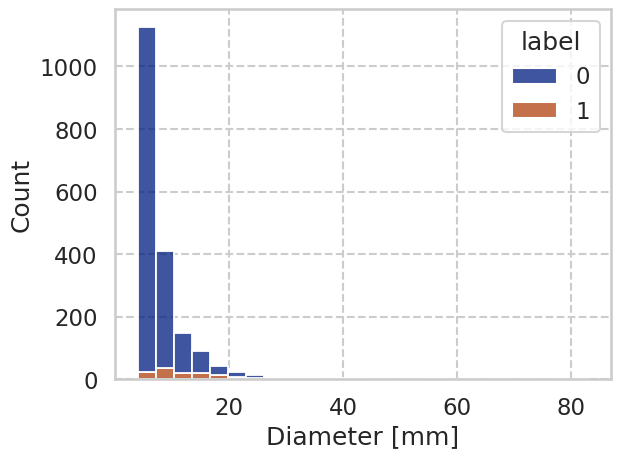

NoduleCounts


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1743.0,2.578313,1.711892,1.0,1.0,2.0,4.0,11.0
1,138.0,2.565217,1.678357,1.0,2.0,2.0,3.0,10.0


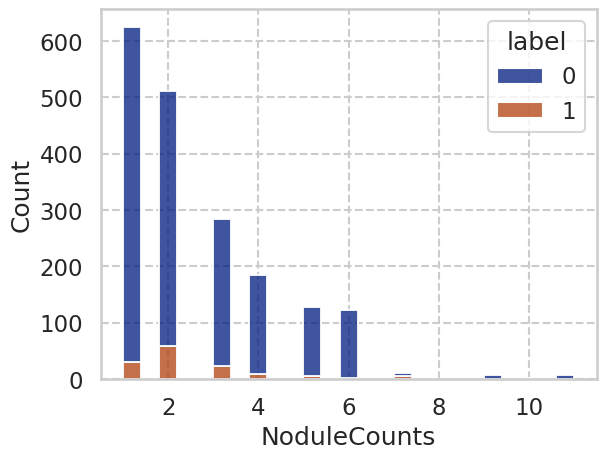

In [27]:
included_num_cols = ["Diameter [mm]", "NoduleCounts"]
for c in included_num_cols:
    print(c)
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

label                                               \
                   count      mean       std  min  25%  50%  75%  max   
bin_Diameter [mm]                                                       
(3.999, 6.3]       944.0  0.018008  0.133052  0.0  0.0  0.0  0.0  1.0   
(6.3, 83.0]        937.0  0.129136  0.335529  0.0  0.0  0.0  0.0  1.0   

                  Diameter [mm]                                            \
                          count       mean       std  min  25%  50%   75%   
bin_Diameter [mm]                                                           
(3.999, 6.3]              944.0   5.069174  0.669462  4.0  4.5  5.0   5.6   
(6.3, 83.0]               937.0  11.186553  6.696431  6.4  7.4  8.9  12.5   

                         
                    max  
bin_Diameter [mm]        
(3.999, 6.3]        6.3  
(6.3, 83.0]        83.0

,num,pct,num_mal,pct_mal
"(3.999, 6.3]",944,50.186071,17,1.800847
"(6.3, 83.0]",937,49.813929,121,12.913554


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(3.999, 6.3]",944,11,159,768,6,0.647059,0.171521,0.352941,0.828479,0.064706,0.992248,0.935294,0.007752,0.825212
"(6.3, 83.0]",937,113,469,347,8,0.933884,0.574755,0.066116,0.425245,0.194158,0.977465,0.805842,0.022535,0.490928


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(3.999, 6.3]",944,15,296,631,2,0.882353,0.319310,0.117647,0.680690,0.048232,0.996840,0.951768,0.003160,0.684322
"(6.3, 83.0]",937,115,455,361,6,0.950413,0.557598,0.049587,0.442402,0.201754,0.983651,0.798246,0.016349,0.508004


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(3.999, 6.3]",944,15,244,683,2,0.882353,0.263215,0.117647,0.736785,0.057915,0.997080,0.942085,0.002920,0.739407
"(6.3, 83.0]",937,117,536,280,4,0.966942,0.656863,0.033058,0.343137,0.179173,0.985915,0.820827,0.014085,0.423693


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(3.999, 6.3]",944,17,348,579,0,1.00000,0.375405,0.00000,0.624595,0.046575,1.000000,0.953425,0.000000,0.631356
"(6.3, 83.0]",937,112,400,416,9,0.92562,0.490196,0.07438,0.509804,0.218750,0.978824,0.781250,0.021176,0.563501


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(3.999, 6.3]",944,7,135,792,10,0.411765,0.145631,0.588235,0.854369,0.049296,0.987531,0.950704,0.012469,0.846398
"(6.3, 83.0]",937,97,251,565,24,0.801653,0.307598,0.198347,0.692402,0.278736,0.959253,0.721264,0.040747,0.706510


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(3.999, 6.3]",944,8,142,785,9,0.470588,0.153182,0.529412,0.846818,0.053333,0.988665,0.946667,0.011335,0.840042
"(6.3, 83.0]",937,101,306,510,20,0.834711,0.375000,0.165289,0.625000,0.248157,0.962264,0.751843,0.037736,0.652081


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(3.999, 6.3]",944,4,95,832,13,0.235294,0.102481,0.764706,0.897519,0.040404,0.984615,0.959596,0.015385,0.885593
"(6.3, 83.0]",937,118,695,121,3,0.975207,0.851716,0.024793,0.148284,0.145141,0.975806,0.854859,0.024194,0.255069


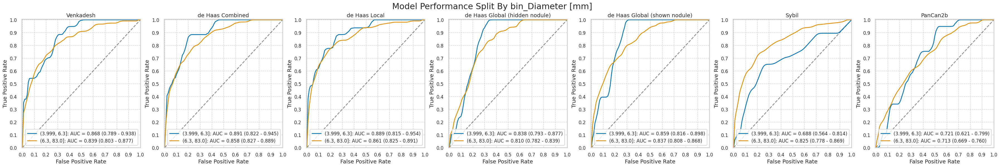

label                                               \
                   count      mean       std  min  25%  50%  75%  max   
bin_NoduleCounts                                                        
(0.999, 2.0]      1136.0  0.079225  0.270209  0.0  0.0  0.0  0.0  1.0   
(2.0, 11.0]        745.0  0.064430  0.245681  0.0  0.0  0.0  0.0  1.0   

                 NoduleCounts                                                
                        count      mean       std  min  25%  50%  75%   max  
bin_NoduleCounts                                                             
(0.999, 2.0]           1136.0  1.449824  0.497695  1.0  1.0  1.0  2.0   2.0  
(2.0, 11.0]             745.0  4.296644  1.449621  3.0  3.0  4.0  5.0  11.0

,num,pct,num_mal,pct_mal
"(0.999, 2.0]",1136,60.393408,90,7.922535
"(2.0, 11.0]",745,39.606592,48,6.442953


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(0.999, 2.0]",1136,82,398,648,8,0.911111,0.380497,0.088889,0.619503,0.170833,0.987805,0.829167,0.012195,0.642606
"(2.0, 11.0]",745,42,230,467,6,0.875000,0.329986,0.125000,0.670014,0.154412,0.987315,0.845588,0.012685,0.683221


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(0.999, 2.0]",1136,85,534,512,5,0.944444,0.510516,0.055556,0.489484,0.137318,0.990329,0.862682,0.009671,0.525528
"(2.0, 11.0]",745,45,217,480,3,0.937500,0.311334,0.062500,0.688666,0.171756,0.993789,0.828244,0.006211,0.704698


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(0.999, 2.0]",1136,85,508,538,5,0.944444,0.485660,0.055556,0.514340,0.143339,0.990792,0.856661,0.009208,0.548415
"(2.0, 11.0]",745,47,272,425,1,0.979167,0.390244,0.020833,0.609756,0.147335,0.997653,0.852665,0.002347,0.633557


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(0.999, 2.0]",1136,83,655,391,7,0.922222,0.626195,0.077778,0.373805,0.112466,0.982412,0.887534,0.017588,0.417254
"(2.0, 11.0]",745,46,93,604,2,0.958333,0.133429,0.041667,0.866571,0.330935,0.996700,0.669065,0.003300,0.872483


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(0.999, 2.0]",1136,66,365,681,24,0.733333,0.348948,0.266667,0.651052,0.153132,0.965957,0.846868,0.034043,0.657570
"(2.0, 11.0]",745,38,21,676,10,0.791667,0.030129,0.208333,0.969871,0.644068,0.985423,0.355932,0.014577,0.958389


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(0.999, 2.0]",1136,67,235,811,23,0.744444,0.224665,0.255556,0.775335,0.221854,0.972422,0.778146,0.027578,0.772887
"(2.0, 11.0]",745,42,213,484,6,0.875000,0.305595,0.125000,0.694405,0.164706,0.987755,0.835294,0.012245,0.706040


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(0.999, 2.0]",1136,80,562,484,10,0.888889,0.537285,0.111111,0.462715,0.124611,0.979757,0.875389,0.020243,0.496479
"(2.0, 11.0]",745,42,228,469,6,0.875000,0.327116,0.125000,0.672884,0.155556,0.987368,0.844444,0.012632,0.685906


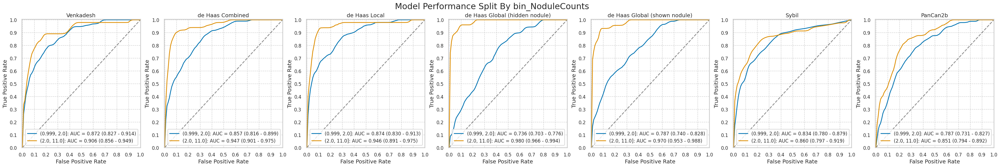

In [28]:
for c in included_num_cols:
    nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2, duplicates='drop')
    display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
    plot_by_category(nlst_preds, f'bin_{c}')

## Further binning categorical columns

In [29]:
nlst_preds[['race', 'ethnic']].value_counts()

race  ethnic
1.0   2.0       1739
2.0   2.0         70
6.0   2.0         30
4.0   2.0         14
1.0   1.0         10
3.0   2.0          9
5.0   2.0          4
Name: count, dtype: int64

,num,pct,num_mal,pct_mal
False,142,7.549176,20,14.084507
True,1739,92.450824,118,6.785509


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,142,16,65,57,4,0.800000,0.532787,0.200000,0.467213,0.197531,0.934426,0.802469,0.065574,0.514085
True,1739,108,563,1058,10,0.915254,0.347316,0.084746,0.652684,0.160954,0.990637,0.839046,0.009363,0.670500


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,142,19,64,58,1,0.950000,0.524590,0.050000,0.475410,0.228916,0.983051,0.771084,0.016949,0.542254
True,1739,111,687,934,7,0.940678,0.423812,0.059322,0.576188,0.139098,0.992561,0.860902,0.007439,0.600920


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,142,20,66,56,0,1.000000,0.540984,0.000000,0.459016,0.232558,1.000000,0.767442,0.000000,0.535211
True,1739,112,714,907,6,0.949153,0.440469,0.050847,0.559531,0.135593,0.993428,0.864407,0.006572,0.585969


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,142,16,63,59,4,0.800000,0.516393,0.200000,0.483607,0.202532,0.936508,0.797468,0.063492,0.528169
True,1739,113,685,936,5,0.957627,0.422579,0.042373,0.577421,0.141604,0.994687,0.858396,0.005313,0.603220


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,142,14,26,96,6,0.700000,0.213115,0.300000,0.786885,0.35,0.941176,0.65,0.058824,0.774648
True,1739,90,360,1261,28,0.762712,0.222085,0.237288,0.777915,0.20,0.978278,0.80,0.021722,0.776883


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,142,14,51,71,6,0.700000,0.418033,0.300000,0.581967,0.215385,0.922078,0.784615,0.077922,0.598592
True,1739,95,397,1224,23,0.805085,0.244911,0.194915,0.755089,0.193089,0.981556,0.806911,0.018444,0.758482


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,142,17,64,58,3,0.850000,0.524590,0.150000,0.475410,0.209877,0.950820,0.790123,0.049180,0.528169
True,1739,105,726,895,13,0.889831,0.447872,0.110169,0.552128,0.126354,0.985683,0.873646,0.014317,0.575043


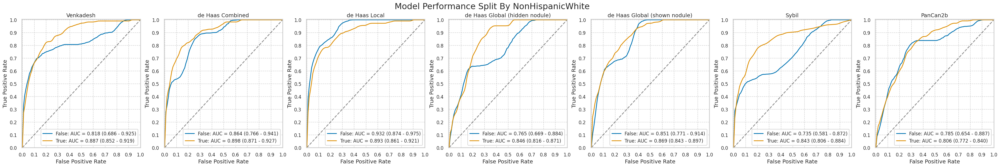

,num,pct,num_mal,pct_mal
False,142,7.549176,20,14.084507
True,1739,92.450824,118,6.785509


In [30]:
non_hispanic_white = (nlst_preds['race'] == 1.0) & (nlst_preds['ethnic'] == 2.0)
nlst_preds['NonHispanicWhite'] = non_hispanic_white
plot_by_category(nlst_preds, 'NonHispanicWhite')

In [31]:
high_school_plus = (nlst_preds['educat'] != 1.0)
nlst_preds['HighSchoolPlus'] = high_school_plus
plot_by_category(nlst_preds, 'HighSchoolPlus')

,num,pct,num_mal,pct_mal
False,50,2.658161,4,8.000000
True,1831,97.341839,134,7.318405


Not plotting ROC since there are zero values for malignant or benign nodules :(


,num,pct,num_mal,pct_mal
False,50,2.658161,4,8.000000
True,1831,97.341839,134,7.318405


,num,pct,num_mal,pct_mal
False,634,33.705476,43,6.782334
True,1247,66.294524,95,7.618284


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,634,39,236,355,4,0.906977,0.399323,0.093023,0.600677,0.141818,0.988858,0.858182,0.011142,0.621451
True,1247,85,392,760,10,0.894737,0.340278,0.105263,0.659722,0.178197,0.987013,0.821803,0.012987,0.677626


de Haas Combined


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,634,40,270,321,3,0.930233,0.456853,0.069767,0.543147,0.129032,0.990741,0.870968,0.009259,0.569401
True,1247,90,481,671,5,0.947368,0.417535,0.052632,0.582465,0.157618,0.992604,0.842382,0.007396,0.610265


de Haas Local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,634,43,277,314,0,1.000000,0.468697,0.000000,0.531303,0.134375,1.00000,0.865625,0.00000,0.563091
True,1247,89,503,649,6,0.936842,0.436632,0.063158,0.563368,0.150338,0.99084,0.849662,0.00916,0.591820


de Haas Global (hidden nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,634,40,273,318,3,0.930233,0.461929,0.069767,0.538071,0.127796,0.990654,0.872204,0.009346,0.564669
True,1247,89,475,677,6,0.936842,0.412326,0.063158,0.587674,0.157801,0.991215,0.842199,0.008785,0.614274


de Haas Global (shown nodule)


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,634,33,130,461,10,0.767442,0.219966,0.232558,0.780034,0.202454,0.978769,0.797546,0.021231,0.779180
True,1247,71,256,896,24,0.747368,0.222222,0.252632,0.777778,0.217125,0.973913,0.782875,0.026087,0.775461


Sybil


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,634,35,155,436,8,0.813953,0.262267,0.186047,0.737733,0.184211,0.981982,0.815789,0.018018,0.742902
True,1247,74,293,859,21,0.778947,0.254340,0.221053,0.745660,0.201635,0.976136,0.798365,0.023864,0.748196


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,634,39,311,280,4,0.906977,0.526227,0.093023,0.473773,0.111429,0.985915,0.888571,0.014085,0.503155
True,1247,83,479,673,12,0.873684,0.415799,0.126316,0.584201,0.147687,0.982482,0.852313,0.017518,0.606255


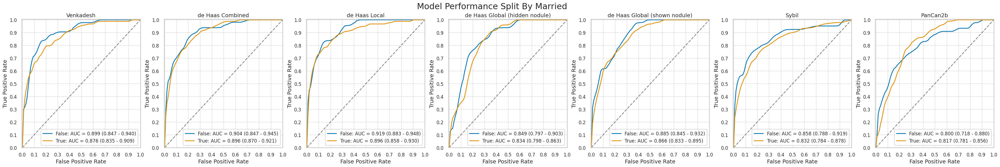

,num,pct,num_mal,pct_mal
False,634,33.705476,43,6.782334
True,1247,66.294524,95,7.618284


In [32]:
married = (nlst_preds['marital'] == 2.0)
nlst_preds['Married'] = married
plot_by_category(nlst_preds, 'Married')